# Instalar ThreeWToolkit do *github* (~3min)



In [2]:
!pip install --quiet --upgrade pip
!pip install --quiet git+https://github.com/petrobras/3W.git


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 81.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires ipykernel==6.17.1, but you have ipykernel 7.1.0 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.3.3 which is incompatible.
jupyter-kernel-gateway 2.5.2 requires jupyter-client<8.0,>=5.2.0, but you have jupyter-client 8.6.3 which is incompatible.
notebook 6.5.7 requires jupyter-client<8,>=5.3.4, but you have jupyter-client 8.6.3 which is incompatible.


# Baixar o dataset (~2min)

In [3]:
from ThreeWToolkit.dataset import ParquetDataset, ParquetDatasetConfig

config = ParquetDatasetConfig(path="./dataset")  # folder where it will be stored
dataset = ParquetDataset(config)


[ParquetDataset] Downloading dataset...


3w_dataset_2.0.0.zip: 100%|██████████| 1.79G/1.79G [01:31<00:00, 19.7MB/s]


[ParquetDataset] Extracting dataset from dataset/download/3w_dataset_2.0.0.zip...
[ParquetDataset] Validating dataset integrity...
[ParquetDataset] Dataset integrity check passed!


# Importar bibliotecas (~6s)

In [4]:
import matplotlib.pyplot as plt

from ThreeWToolkit.pipeline import Pipeline
from ThreeWToolkit.core.base_dataset import ParquetDatasetConfig
from ThreeWToolkit.core.base_preprocessing import (
    ImputeMissingConfig,
    NormalizeConfig,
    WindowingConfig,
)
from ThreeWToolkit.core.base_assessment import ModelAssessmentConfig
from ThreeWToolkit.core.enums import (
    TaskType,
    ModelTypeEnum,
    ActivationFunctionEnum,
    OptimizersEnum
)
from ThreeWToolkit.models.mlp import MLPConfig
from ThreeWToolkit.trainer.trainer import TrainerConfig
from ThreeWToolkit.core.base_feature_extractor import (
    StatisticalConfig,
    EWStatisticalConfig,
    WaveletConfig,
)
from ThreeWToolkit.core.base_models import ModelsConfig, BaseModels
from ThreeWToolkit.models.sklearn_models import SklearnModelsConfig, SklearnModels
from ThreeWToolkit.core.base_model_trainer import ModelTrainerConfig

# Define dataset path
dataset_path = "./dataset"

# Pipeline 1: Basic MLP (3min)



### Dados
* 70% treino 30% teste
* Apenas dados dos sensores T-JUS-CKP", "T-MON-CKP"
* Considera apenas as classes 0 e 1
* Janelas de 100 amostras

### Modelo
*   Arquitetura: MLP totalmente conectado

* Camadas ocultas: 1ª camada com 64 neurônios e 2ª camada com 32 neurônios

* Função de ativação: ReLU

* Saída: 2 classes (classificação binária)

* Regularização: L2

* Seed: 42

### Treinamento
* Otimizador: Adam
* Critério: cross entropy

* Épocas: 20

* Batch size: 32

* Learning rate: 0.001

* Cross-validation: desativado

* Shuffle no treino: sim

* Seed: 42

In [11]:
# Define the model configuration
config_model = MLPConfig(
    hidden_sizes=(64, 32),
    output_size=2,
    random_seed=42,
    activation_function="relu",
    regularization=None,
)

# Create the pipeline with sequential steps
pipeline = Pipeline(
    [
        # Step 1: Load Dataset
        ParquetDatasetConfig(
            path=dataset_path,
            split=None,
            force_download=False,
            columns=["T-JUS-CKP", "T-MON-CKP"],
            target_column="class",
            target_class=[0, 1],
        ),
        # Step 2: Preprocessing
        ImputeMissingConfig(strategy="median", columns=["T-JUS-CKP"]),
        NormalizeConfig(norm="l2"),
        WindowingConfig(window_size=100),
        # Step 3: Model Training
        TrainerConfig(
            optimizer="adam",
            criterion="cross_entropy",
            batch_size=32,
            epochs=10,
            seed=42,
            config_model=config_model,
            learning_rate=0.001,
            cross_validation=False,
            shuffle_train=True,
        ),
        # Step 4: Model Assessment
        ModelAssessmentConfig(
            metrics=["balanced_accuracy", "precision", "recall", "f1"],
            task_type=TaskType.CLASSIFICATION,
            export_results=True,
            generate_report=True,           # Important option to enable report generation through the Pipeline class
        ),
    ]
)

[ParquetDataset] Dataset found at ./dataset
[ParquetDataset] Validating dataset integrity...
[ParquetDataset] Dataset integrity check passed!
>> ['T-JUS-CKP', 'T-MON-CKP']


In [ ]:
import time
# Execute the entire pipeline
start_time = time.perf_counter()
pipeline.run()
end_time = time.perf_counter()

elapsed_seconds = end_time - start_time
print(f"Tempo total da pipeline: {elapsed_seconds:.2f} s ({elapsed_seconds/60:.2f} min)")


[Pipeline] Processing batches:   0%|          | 0/722 [00:00<?, ?file/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

### Resumo

treina um modelo MLP simples, com duas camadas densas e ReLU, usando dados em janelas temporais obtidas de duas variáveis do dataset Parquet, com imputação média e normalização z-score. O treino roda por 20 épocas com LR=0.001, shuffle ativado e sem cross-validation. A avaliação calcula balanced accuracy, precision, recall e F1, com exportação de resultados e relatório automático.

### Resultados


```
Metrics:
  balanced_accuracy: 0.8491
  precision: 0.8534
  recall: 0.8385
  f1: 0.8405
Tempo total da pipeline: 222.47 s (3.71 min)
```



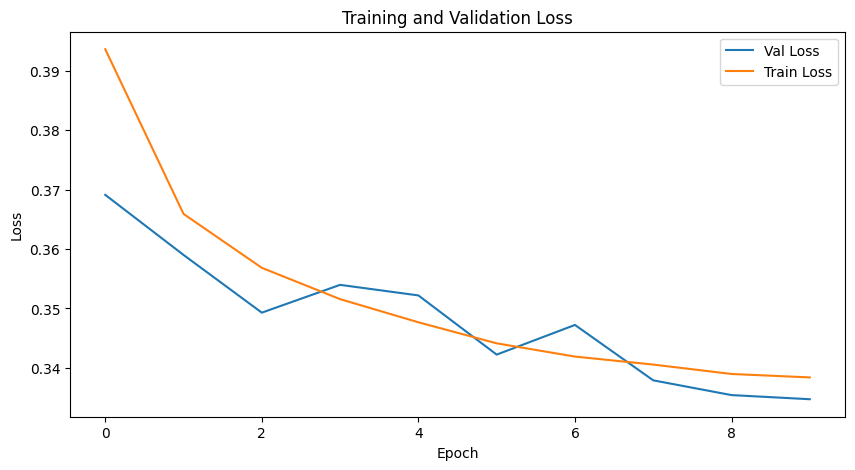



# Pipeline 2: MLP with statistical features without regularization

### Dados
* 70% treino 30% teste
* Apenas dados dos sensores "T-JUS-CKP", "T-MON-CKP", "P-PDG"
* Considera as classes 0, 1 e 2
* Janelas de 150 amostras

### Modelo
*  Arquitetura: MLP

* Camadas ocultas: 128, 64 e 32

* Função de ativação: ReLU

* Saída: 3 classes

* Regularização: l1, Valores faltantes (NaN) serão preenchidos usando a média da coluna

* Seed: 42

### Treinamento
* Otimizador: Adam
* Critério: cross entropy
* Épocas: 50
* Batch size: 64
* Learning rate: 0.0005
* Cross-validation: sim
* Shuffle no treino: sim
* Seed: 42

In [5]:
config_model_stats = MLPConfig(
    hidden_sizes=(128, 64, 32),
    output_size=3,
    random_seed=42,
    activation_function="relu",
    regularization=None,
)

pipeline_stats = Pipeline(
    [
        ParquetDatasetConfig(
            path=dataset_path,
            split=None,
            force_download=False,
            columns=["T-JUS-CKP", "T-MON-CKP", "P-PDG"],
            target_column="class",
            target_class=[0, 1, 2],
        ),
        ImputeMissingConfig(strategy="mean", columns=None),  # Impute all columns
        NormalizeConfig(norm="l2"),
        WindowingConfig(window_size=100),
        StatisticalConfig(),  # Extract statistical features
        TrainerConfig(
            optimizer="adam",
            criterion="cross_entropy",
            batch_size=64,
            epochs=50,
            seed=42,
            config_model=config_model_stats,
            learning_rate=0.0005,
            cross_validation=True,
            shuffle_train=True,
        ),
        ModelAssessmentConfig(
            metrics=["balanced_accuracy", "precision", "recall", "f1"],
            task_type=TaskType.CLASSIFICATION,
            export_results=True,
            generate_report=False,
        ),
    ]
)

print("Pipeline with Statistical Features created successfully!")
print("This pipeline will:")
print("1. Load dataset with 3 classes")
print("2. Apply mean imputation to all columns")
print("3. Standardize the data")
print("4. Create windows of size 150")
print("5. Extract statistical features")
print("6. Train MLP with cross-validation")
print("7. Generate comprehensive assessment report")

[ParquetDataset] Dataset found at ./dataset
[ParquetDataset] Validating dataset integrity...
[ParquetDataset] Dataset integrity check passed!
>> ['T-JUS-CKP', 'T-MON-CKP', 'P-PDG']
Pipeline with Statistical Features created successfully!
This pipeline will:
1. Load dataset with 3 classes
2. Apply mean imputation to all columns
3. Standardize the data
4. Create windows of size 150
5. Extract statistical features
6. Train MLP with cross-validation
7. Generate comprehensive assessment report


[Pipeline] Processing batches:   0%|          | 0/760 [00:00<?, ?file/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Training Fold 1:   0%|          | 0/5 [00:00<?, ?fold/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

Results exported to /usr/local/lib/python3.12/dist-packages/output
Model Assessment Summary
Model: MLP
Task Type: TaskType.CLASSIFICATION
Timestamp: 2025-12-11T00:13:41.468618

Metrics:
  balanced_accuracy: 0.9395
  precision: 0.9699
  recall: 0.9699
  f1: 0.9699
Tempo total da pipeline: 1479.59 s (24.66 min)


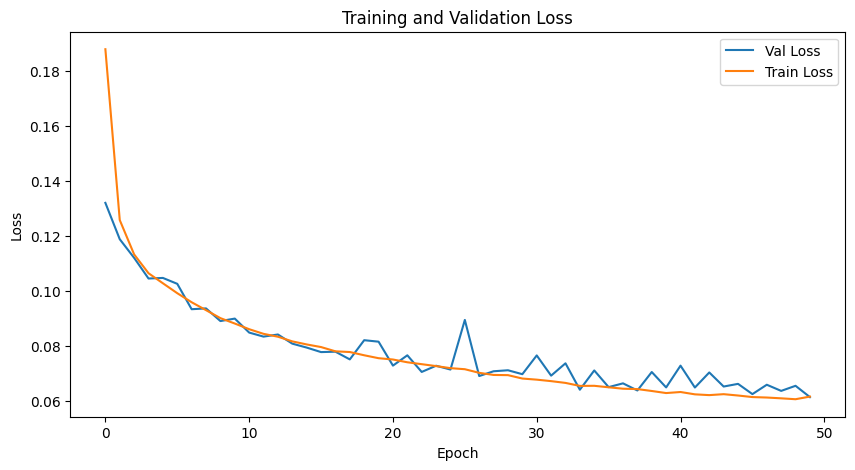

In [6]:
import time
# Execute the entire pipeline
start_time = time.perf_counter()
pipeline_stats.run()
end_time = time.perf_counter()

elapsed_seconds = end_time - start_time
print(f"Tempo total da pipeline: {elapsed_seconds:.2f} s ({elapsed_seconds/60:.2f} min)")

hist = pipeline_stats.step_model_training.history[0]

plt.figure(figsize=(10, 5))
plt.plot(hist["val_loss"], label="Val Loss")
plt.plot(hist["train_loss"], label="Train Loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()


### Resumo

O modelo adotado é um MLP. O treinamento utiliza otimizador Adam. A validação é realizada por cross-validation estratificado, garantindo que cada classe esteja proporcionalmente representada em todos os folds. Ao final, o modelo é avaliado com métricas de balanced accuracy, precision, recall e F1-score, gerando relatórios completos de desempenho.

### Resultados
```
Metrics:
  balanced_accuracy: 0.9504
  precision: 0.9727
  recall: 0.9727
  f1: 0.9727
Tempo total da pipeline: 1052.78 s (17.55 min)
```



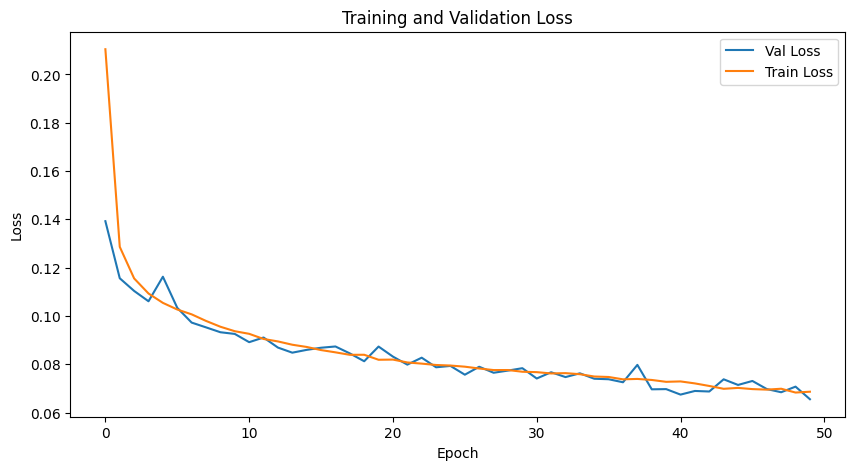


Notas:
- quero adicionar early stop ou algo do tipo

- investigar tecnicas de regularizacao

- investigar otimizadores

Pipeline

### Dados
* 70% treino 30% teste
* Apenas dados dos sensores "T-JUS-CKP", "T-MON-CKP", "P-PDG"
* Considera as classes 0, 1 e 2
* Janelas de 150 amostras

### Modelo
*  Arquitetura: MLP

* Camadas ocultas: 128, 64 e 32

* Função de ativação: ReLU

* Saída: 3 classes

* Regularização: L2, Valores faltantes (NaN) serão preenchidos usando a média da coluna

* Seed: 42

### Treinamento
* Otimizador: Adam
* Critério: cross entropy
* Épocas: 50
* Batch size: 64
* Learning rate: 0.0005
* Cross-validation: sim
* Shuffle no treino: sim
* Seed: 42

In [7]:
config_model_stats = MLPConfig(
    hidden_sizes=(128, 64, 32),
    output_size=3,
    random_seed=42,
    activation_function="relu",
    regularization=0.1,
)

pipeline_stats = Pipeline(
    [
        ParquetDatasetConfig(
            path=dataset_path,
            split=None,
            force_download=False,
            columns=["T-JUS-CKP", "T-MON-CKP", "P-PDG"],
            target_column="class",
            target_class=[0, 1, 2],
        ),
        ImputeMissingConfig(strategy="mean", columns=None),  # Impute all columns
        NormalizeConfig(norm="l2"),
        WindowingConfig(window_size=150),
        StatisticalConfig(),  # Extract statistical features
        TrainerConfig(
            optimizer="adam",
            criterion="cross_entropy",
            batch_size=64,
            epochs=50,
            seed=42,
            config_model=config_model_stats,
            learning_rate=0.0005,
            cross_validation=True,
            shuffle_train=True,
        ),
        ModelAssessmentConfig(
            metrics=["balanced_accuracy", "precision", "recall", "f1"],
            task_type=TaskType.CLASSIFICATION,
            export_results=True,
            generate_report=False,
        ),
    ]
)

[ParquetDataset] Dataset found at ./dataset
[ParquetDataset] Validating dataset integrity...
[ParquetDataset] Dataset integrity check passed!
>> ['T-JUS-CKP', 'T-MON-CKP', 'P-PDG']


In [8]:
import time
# Execute the entire pipeline
start_time = time.perf_counter()
pipeline_stats.run()
end_time = time.perf_counter()

elapsed_seconds = end_time - start_time
print(f"Tempo total da pipeline: {elapsed_seconds:.2f} s ({elapsed_seconds/60:.2f} min)")

hist = pipeline_stats.step_model_training.history[0]

plt.figure(figsize=(10, 5))
plt.plot(hist["val_loss"], label="Val Loss")
plt.plot(hist["train_loss"], label="Train Loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()


[Pipeline] Processing batches:   0%|          | 0/760 [00:00<?, ?file/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Training Fold 1:   0%|          | 0/5 [00:00<?, ?fold/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

KeyboardInterrupt: 

### Resultados
```
Metrics:
  balanced_accuracy: 0.9311
  precision: 0.9743
  recall: 0.9744
  f1: 0.9742
Tempo total da pipeline: 1050.70 s (17.51 min)

```
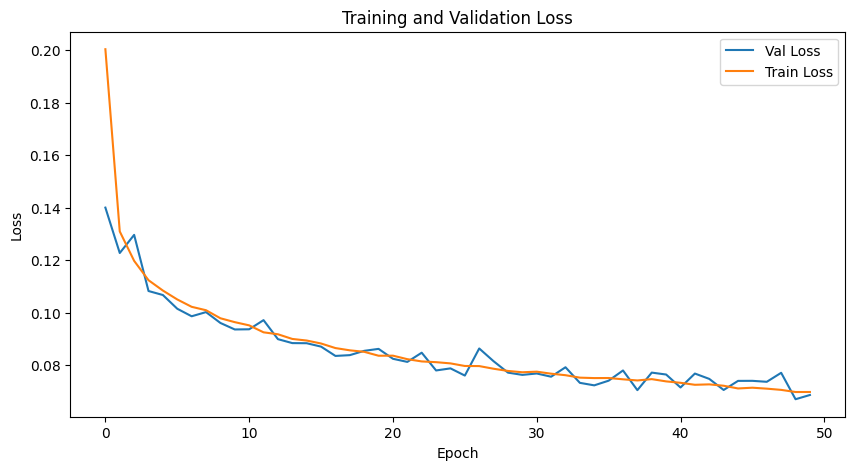

# Pipeline 3: MLP with statistical features with regularization

### Dados
* 70% treino 30% teste
* Apenas dados dos sensores "T-JUS-CKP", "T-MON-CKP", "P-PDG"
* Considera as classes 0, 1 e 2
* Janelas de 150 amostras

### Modelo
*  Arquitetura: MLP

* Camadas ocultas: 128, 64 e 32

* Função de ativação: ReLU

* Saída: 3 classes

* Regularização: l1, Valores faltantes (NaN) serão preenchidos usando a média da coluna

* Seed: 42

### Treinamento
* Otimizador: Adam
* Critério: cross entropy
* Épocas: 50
* Batch size: 64
* Learning rate: 0.0005
* Cross-validation: sim
* Shuffle no treino: sim
* Seed: 42

In [9]:
config_model_stats = MLPConfig(
    hidden_sizes=(128, 64, 32),
    output_size=3,
    random_seed=42,
    activation_function="relu",
    regularization=0.1,
)

pipeline_stats = Pipeline(
    [
        ParquetDatasetConfig(
            path=dataset_path,
            split=None,
            force_download=False,
            columns=["T-JUS-CKP", "T-MON-CKP", "P-PDG"],
            target_column="class",
            target_class=[0, 1, 2],
        ),
        ImputeMissingConfig(strategy="mean", columns=None),  # Impute all columns
        NormalizeConfig(norm="l2"),
        WindowingConfig(window_size=100),
        StatisticalConfig(),  # Extract statistical features
        TrainerConfig(
            optimizer="adam",
            criterion="cross_entropy",
            batch_size=64,
            epochs=50,
            seed=42,
            config_model=config_model_stats,
            learning_rate=0.0005,
            cross_validation=True,
            shuffle_train=True,
        ),
        ModelAssessmentConfig(
            metrics=["balanced_accuracy", "precision", "recall", "f1"],
            task_type=TaskType.CLASSIFICATION,
            export_results=True,
            generate_report=False,
        ),
    ]
)

print("Pipeline with Statistical Features created successfully!")
print("This pipeline will:")
print("1. Load dataset with 3 classes")
print("2. Apply mean imputation to all columns")
print("3. Standardize the data")
print("4. Create windows of size 150")
print("5. Extract statistical features")
print("6. Train MLP with cross-validation")
print("7. Generate comprehensive assessment report")

[ParquetDataset] Dataset found at ./dataset
[ParquetDataset] Validating dataset integrity...
[ParquetDataset] Dataset integrity check passed!
>> ['T-JUS-CKP', 'T-MON-CKP', 'P-PDG']
Pipeline with Statistical Features created successfully!
This pipeline will:
1. Load dataset with 3 classes
2. Apply mean imputation to all columns
3. Standardize the data
4. Create windows of size 150
5. Extract statistical features
6. Train MLP with cross-validation
7. Generate comprehensive assessment report


[Pipeline] Processing batches:   0%|          | 0/760 [00:00<?, ?file/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Training Fold 1:   0%|          | 0/5 [00:00<?, ?fold/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

Results exported to /usr/local/lib/python3.12/dist-packages/output
Model Assessment Summary
Model: MLP
Task Type: TaskType.CLASSIFICATION
Timestamp: 2025-12-11T00:50:26.814897

Metrics:
  balanced_accuracy: 0.9413
  precision: 0.9733
  recall: 0.9733
  f1: 0.9733
Tempo total da pipeline: 1513.93 s (25.23 min)


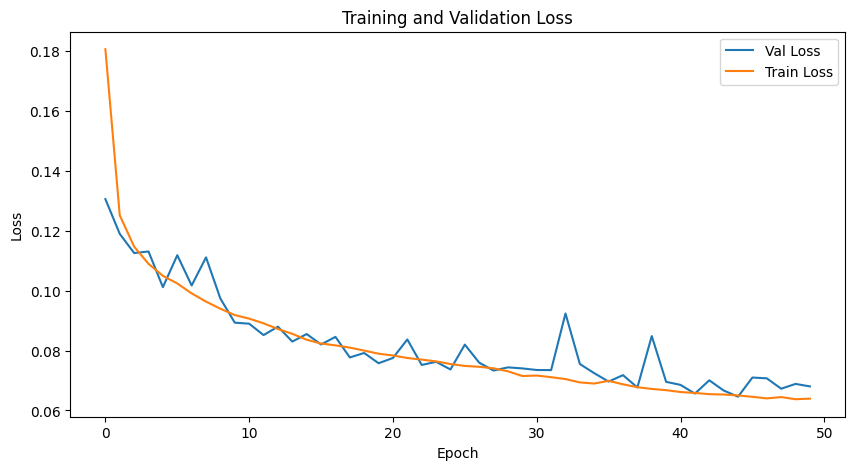

In [10]:
import time
# Execute the entire pipeline
start_time = time.perf_counter()
pipeline_stats.run()
end_time = time.perf_counter()

elapsed_seconds = end_time - start_time
print(f"Tempo total da pipeline: {elapsed_seconds:.2f} s ({elapsed_seconds/60:.2f} min)")

hist = pipeline_stats.step_model_training.history[0]

plt.figure(figsize=(10, 5))
plt.plot(hist["val_loss"], label="Val Loss")
plt.plot(hist["train_loss"], label="Train Loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()


### Resumo

O modelo adotado é um MLP. O treinamento utiliza otimizador Adam. A validação é realizada por cross-validation estratificado, garantindo que cada classe esteja proporcionalmente representada em todos os folds. Ao final, o modelo é avaliado com métricas de balanced accuracy, precision, recall e F1-score, gerando relatórios completos de desempenho.

### Resultados
```
Metrics:
  balanced_accuracy: 0.9504
  precision: 0.9727
  recall: 0.9727
  f1: 0.9727
Tempo total da pipeline: 1052.78 s (17.55 min)
```



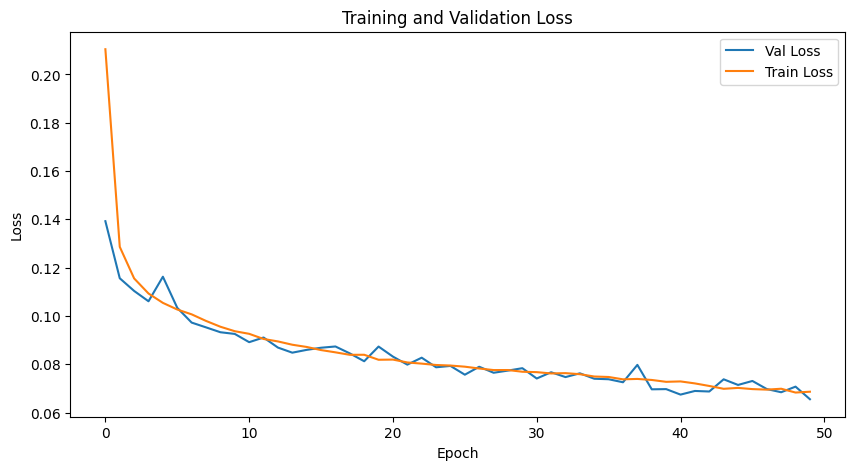


Notas:
- quero adicionar early stop ou algo do tipo

- investigar tecnicas de regularizacao

- investigar otimizadores

Pipeline

### Dados
* 70% treino 30% teste
* Apenas dados dos sensores "T-JUS-CKP", "T-MON-CKP", "P-PDG"
* Considera as classes 0, 1 e 2
* Janelas de 150 amostras

### Modelo
*  Arquitetura: MLP

* Camadas ocultas: 128, 64 e 32

* Função de ativação: ReLU

* Saída: 3 classes

* Regularização: L2, Valores faltantes (NaN) serão preenchidos usando a média da coluna

* Seed: 42

### Treinamento
* Otimizador: Adam
* Critério: cross entropy
* Épocas: 50
* Batch size: 64
* Learning rate: 0.0005
* Cross-validation: sim
* Shuffle no treino: sim
* Seed: 42

In [ ]:
config_model_stats = MLPConfig(
    hidden_sizes=(128, 64, 32),
    output_size=3,
    random_seed=42,
    activation_function="relu",
    regularization=0.1,
)

pipeline_stats = Pipeline(
    [
        ParquetDatasetConfig(
            path=dataset_path,
            split=None,
            force_download=False,
            columns=["T-JUS-CKP", "T-MON-CKP", "P-PDG"],
            target_column="class",
            target_class=[0, 1, 2],
        ),
        ImputeMissingConfig(strategy="mean", columns=None),  # Impute all columns
        NormalizeConfig(norm="l2"),
        WindowingConfig(window_size=150),
        StatisticalConfig(),  # Extract statistical features
        TrainerConfig(
            optimizer="adam",
            criterion="cross_entropy",
            batch_size=64,
            epochs=50,
            seed=42,
            config_model=config_model_stats,
            learning_rate=0.0005,
            cross_validation=True,
            shuffle_train=True,
        ),
        ModelAssessmentConfig(
            metrics=["balanced_accuracy", "precision", "recall", "f1"],
            task_type=TaskType.CLASSIFICATION,
            export_results=True,
            generate_report=False,
        ),
    ]
)

[ParquetDataset] Dataset found at ./dataset
[ParquetDataset] Validating dataset integrity...
[ParquetDataset] Dataset integrity check passed!
>> ['T-JUS-CKP', 'T-MON-CKP', 'P-PDG']


In [ ]:
import time
# Execute the entire pipeline
start_time = time.perf_counter()
pipeline_stats.run()
end_time = time.perf_counter()

elapsed_seconds = end_time - start_time
print(f"Tempo total da pipeline: {elapsed_seconds:.2f} s ({elapsed_seconds/60:.2f} min)")

hist = pipeline_stats.step_model_training.history[0]

plt.figure(figsize=(10, 5))
plt.plot(hist["val_loss"], label="Val Loss")
plt.plot(hist["train_loss"], label="Train Loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()


[Pipeline] Processing batches:   0%|          | 0/760 [00:00<?, ?file/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

[Pipeline] Feature Extraction:   0%|          | 0/1 [00:00<?, ?step/s]

[Pipeline] Training Fold 1:   0%|          | 0/5 [00:00<?, ?fold/s]

[Pipeline] Training:   0%|          | 0/50 [00:00<?, ?epoch/s]

KeyboardInterrupt: 

### Resultados
```
Metrics:
  balanced_accuracy: 0.9311
  precision: 0.9743
  recall: 0.9744
  f1: 0.9742
Tempo total da pipeline: 1050.70 s (17.51 min)

```
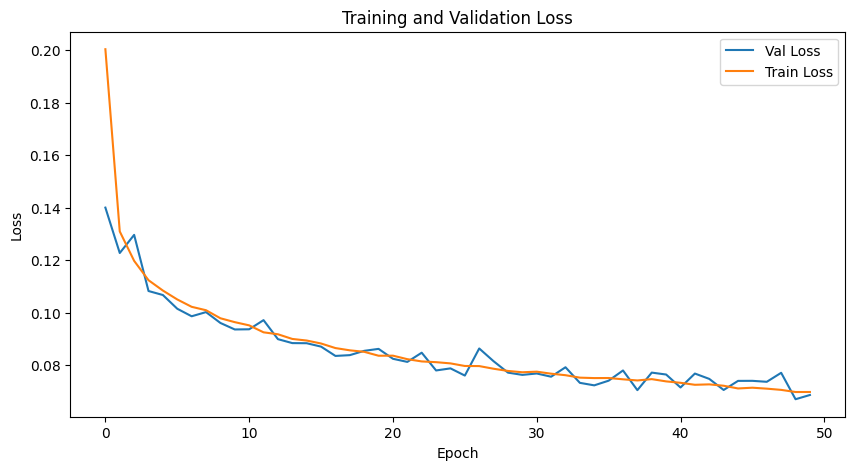

# Pipeline 4: CNN

### Dados
* 70% treino 30% teste
* Apenas dados dos sensores "T-JUS-CKP", "T-MON-CKP", "P-PDG"
* Considera as classes 0, 1 e 2
* Janelas de 150 amostras

### Modelo
*  Arquitetura: TCN

* Camadas ocultas: 128, 64 e 32

* Função de ativação: ReLU

* Saída: 3 classes

* Regularização: l1, Valores faltantes (NaN) serão preenchidos usando a média da coluna

* Seed: 42

### Treinamento
* Otimizador: Adam
* Critério: cross entropy
* Épocas: 50
* Batch size: 64
* Learning rate: 0.0005
* Cross-validation: sim
* Shuffle no treino: sim
* Seed: 42

### **CNN1D** tradicional

In [ ]:
import torch.nn as nn
import torch
from torch.utils.data import DataLoader
import numpy as np

from typing import Iterable, Any, TypeAlias, Union, Callable
from pydantic import Field, field_validator


ParamsT: TypeAlias = Union[
    Iterable[torch.Tensor],
    Iterable[dict[str, Any]],
    Iterable[tuple[str, torch.Tensor]],
]


class TCNConfig(ModelsConfig):
    """Configuration class for Temporal Convolutional Network (TCN) model.

    This class defines all architectural parameters needed to configure a
    1D temporal convolutional network over sequences.

    A TCN is well-suited for data com estrutura temporal, pois aplica
    convoluções ao longo do eixo do tempo e, depois, um pooling global
    para gerar um embedding fixo antes da camada totalmente conectada final.

    Args:
        model_type (str, optional): Automatically set to TCN.
        input_channels (int): Number of input channels (e.g., número de sinais).
            Defaults to 1 (sequência escalar por janela).
        num_filters (tuple[int, ...]): Number of filters in each Conv1d layer.
        kernel_size (int): Convolution kernel size. Must be >= 2.
        output_size (int): Number of output neurons (e.g., número de classes).
        activation_function (str): "relu", "sigmoid", "tanh".
        dropout (float): Dropout rate between conv blocks.
        regularization (float | None): L2 regularization (se usado pelo otimizador).
    """

    model_type: str = "tcn"

    input_channels: int = Field(
        default=1,
        gt=0,
        description="Number of input channels (must be > 0).",
    )
    num_filters: tuple[int, ...] = Field(
        ...,
        min_length=1,
        description="Number of filters for each Conv1d layer.",
    )
    kernel_size: int = Field(
        default=3,
        ge=2,
        description="Kernel size for all Conv1d layers (>=2).",
    )
    output_size: int = Field(
        ..., gt=0, description="Number of output features/classes (must be > 0)."
    )
    activation_function: str = Field(
        default="relu",
        description="Activation function to use after convolutions.",
    )
    dropout: float = Field(
        default=0.0,
        ge=0.0,
        le=1.0,
        description="Dropout rate applied between Conv1d blocks.",
    )
    regularization: float | None = Field(
        default=None,
        ge=0.0,
        description="L2 regularization parameter (>=0 or None).",
    )

    @field_validator("activation_function")
    @classmethod
    def check_activation_function(cls, v: str):
        valid = {
            ActivationFunctionEnum.RELU.value,
            ActivationFunctionEnum.SIGMOID.value,
            ActivationFunctionEnum.TANH.value,
        }
        if v not in valid:
            raise ValueError(f"activation_function must be one of {valid}")
        return v

    @field_validator("num_filters")
    @classmethod
    def check_num_filters(cls, v: tuple[int, ...]):
        if not v or not all(isinstance(h, int) and h > 0 for h in v):
            raise ValueError("num_filters must be a tuple of positive integers")
        return v

class TCN(BaseModels, nn.Module):
    """Temporal Convolutional Network (TCN) implementation using Conv1d.

    This model assumes that each input amostra é uma sequência 1D, recebida
    inicialmente como tensor de shape (batch_size, L). O modelo converte
    isso internamente para (batch_size, C, L), com C = input_channels.

    Se quiser usar múltiplos canais, você pode organizar os dados de forma
    que cada janela tenha L * C features e depois adaptar o forward para
    reformatar, mas o caso padrão é C=1.
    """

    config: TCNConfig

    def __init__(self, config: TCNConfig) -> None:
        super().__init__(config=config)
        self.config = config

        self.activation = self._get_activation_function(config.activation_function)
        self.dropout = nn.Dropout(config.dropout)

        layers: list[nn.Module] = []
        in_channels = config.input_channels

        # Pilha de Conv1d
        for nf in config.num_filters:
            layers.append(nn.Conv1d(in_channels, nf, kernel_size=config.kernel_size, padding="same"))
            layers.append(self.activation)
            if config.dropout > 0.0:
                layers.append(self.dropout)
            in_channels = nf

        self.conv_net = nn.Sequential(*layers)

        # Pooling global ao longo do tempo: reduz (B, C, L) para (B, C, 1)
        self.global_pool = nn.AdaptiveAvgPool1d(1)

        # Camada final totalmente conectada
        self.fc = nn.Linear(in_channels, config.output_size)

    def _get_activation_function(self, activation: str) -> nn.Module:
        if activation == ActivationFunctionEnum.RELU.value:
            return nn.ReLU()
        elif activation == ActivationFunctionEnum.SIGMOID.value:
            return nn.Sigmoid()
        elif activation == ActivationFunctionEnum.TANH.value:
            return nn.Tanh()
        else:
            raise ValueError(f"Unknown activation function: {activation}")

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Forward pass.

        Espera:
        - x com shape (batch_size, L) ou
        - x com shape (batch_size, C, L)

        Se vier (B, L), assume C=1 e faz unsqueeze no canal.
        """
        if x.dim() == 2:
            # (B, L) -> (B, 1, L)
            x = x.unsqueeze(1)
        elif x.dim() == 3:
            # (B, C, L): assume já no formato certo
            pass
        else:
            raise ValueError(f"Expected input with 2 or 3 dims, got {x.shape}")

        x = self.conv_net(x)               # (B, C_out, L)
        x = self.global_pool(x)            # (B, C_out, 1)
        x = x.squeeze(-1)                  # (B, C_out)
        logits = self.fc(x)                # (B, output_size)
        return logits

    def get_params(self) -> ParamsT:
        """Return model parameters for optimization."""
        return self.parameters()

    def _train_epoch(
        self,
        model: nn.Module,
        train_loader: DataLoader,
        criterion: Callable,
        optimizer: torch.optim.Optimizer,
        device: str,
    ) -> float:
        model.train()
        epoch_train_loss = 0.0

        for x_values, y_values in train_loader:
            x_values, y_values = x_values.to(device), y_values.to(device)

            optimizer.zero_grad()
            outputs = model(x_values)

            # Mesma lógica de detecção de tarefa usada no MLP
            if outputs.shape[1] > 1:  # Multiclass classification
                y_values = y_values.long()
                loss = criterion(outputs, y_values)
            else:  # Binary classification ou regressão
                if isinstance(criterion, nn.BCEWithLogitsLoss):
                    y_values = y_values.float()
                    loss = criterion(outputs.squeeze(1), y_values)
                else:
                    y_values = y_values.float()
                    loss = criterion(outputs.squeeze(1), y_values)

            loss.backward()
            optimizer.step()
            epoch_train_loss += loss.item()

        return epoch_train_loss / len(train_loader)

    def _calculate_val_loss(
        self,
        val_loader: DataLoader,
        criterion: Callable,
        device: str,
    ) -> float:
        if self.fc is None:
            raise ValueError("Model should be built before validation")

        self.eval()
        running_loss = 0.0

        with torch.no_grad():
            for x_values, y_values in val_loader:
                x_values, y_values = x_values.to(device), y_values.to(device)
                outputs = self.forward(x_values)

                if outputs.shape[1] > 1:
                    y_values = y_values.long()
                    loss = criterion(outputs, y_values)
                else:
                    if isinstance(criterion, nn.BCEWithLogitsLoss):
                        y_values = y_values.float()
                        loss = criterion(outputs.squeeze(1), y_values)
                    else:
                        y_values = y_values.float()
                        loss = criterion(outputs.squeeze(1), y_values)

                running_loss += loss.item()

        return running_loss / len(val_loader)

    def fit(
        self,
        train_loader: DataLoader,
        epochs: int,
        optimizer: torch.optim.Optimizer,
        criterion: Callable,
        val_loader: DataLoader | None = None,
        device: str = "cuda" if torch.cuda.is_available() else "cpu",
    ) -> dict[str, list[Any]]:
        """Train TCN model, seguindo a mesma interface do MLP."""
        self.to(device)

        loss_dict: dict[str, list[Any]] = {"train_loss": []}
        if val_loader is not None:
            loss_dict["val_loss"] = []

        pbar = tqdm(
            range(epochs),
            desc="[Pipeline] Training (TCN)",
            unit="epoch",
            colour="#00b4d8",
        )

        for epoch_idx in pbar:
            avg_epoch_train_loss = self._train_epoch(
                model=self,
                train_loader=train_loader,
                criterion=criterion,
                optimizer=optimizer,
                device=device,
            )
            loss_dict["train_loss"].append(avg_epoch_train_loss)

            if val_loader is not None:
                val_loss = self._calculate_val_loss(val_loader, criterion, device)
                loss_dict["val_loss"].append(val_loss)
                pbar.set_description_str(
                    f"[Pipeline] Training (TCN) | train_loss: {avg_epoch_train_loss:.4f}, val_loss: {val_loss:.4f}"
                )
            else:
                pbar.set_description_str(
                    f"[Pipeline] Training (TCN) | train_loss: {avg_epoch_train_loss:.4f}"
                )

        return loss_dict

    def predict(
        self,
        X: Any,
        device: str = "cuda" if torch.cuda.is_available() else "cpu",
        batch_size: int = 256,
    ) -> np.ndarray:
        """Gera predições a partir de X no mesmo estilo do MLP.predict.

        X pode ser:
        - pandas.DataFrame
        - numpy.ndarray
        - torch.Tensor

        Saída: np.ndarray 1D com rótulos preditos.
        """
        # Converte X para numpy
        if hasattr(X, "values"):  # DataFrame / Series
            X_np = X.values
        elif isinstance(X, torch.Tensor):
            X_np = X.detach().cpu().numpy()
        else:
            X_np = np.asarray(X)

        # Garante float32
        X_np = X_np.astype("float32")

        # Ajusta forma para o TCN:
        # aqui assumo que cada linha é uma janela achatada (N, F)
        # e trato como (N, 1, F): sequência de comprimento F com 1 canal
        if X_np.ndim == 2:
            X_np = X_np[:, None, :]  # (batch, 1, seq_len)
        elif X_np.ndim == 3:
            # já está em (batch, channels, seq_len) ou (batch, seq_len, channels)
            # se for (batch, seq_len, channels), você pode ajustar aqui:
            # X_np = np.transpose(X_np, (0, 2, 1))
            pass
        else:
            raise ValueError(f"Expected X with 2 or 3 dims, got shape {X_np.shape}")

        dataset = TensorDataset(torch.tensor(X_np, dtype=torch.float32))
        loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

        self.eval()
        self.to(device)

        y_pred: list[Any] = []
        with torch.no_grad():
            for (X_batch,) in loader:
                X_batch = X_batch.to(device)
                outputs = self.forward(X_batch)

                if outputs.shape[1] > 1:  # Multiclasse
                    _, preds = torch.max(outputs, 1)
                elif outputs.shape[1] == 1:  # Binário
                    preds = (torch.sigmoid(outputs) > 0.5).long().squeeze(1)
                else:  # Regressão
                    preds = outputs.squeeze(1)

                y_pred.extend(preds.cpu().numpy())

        return np.array(y_pred)


### MyTrainerConfig

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd

from pathlib import Path
from typing import Callable, Any
from torch.utils.data import DataLoader
from pydantic import field_validator

from tqdm.auto import tqdm
from sklearn.model_selection import StratifiedKFold, train_test_split

from ThreeWToolkit.core.base_step import BaseStep
from ThreeWToolkit.core.base_model_trainer import ModelTrainerConfig
from ThreeWToolkit.core.enums import OptimizersEnum, CriterionEnum, TaskType
from ThreeWToolkit.models.mlp import MLPConfig, MLP
from ThreeWToolkit.models.sklearn_models import SklearnModelsConfig, SklearnModels
from ThreeWToolkit.utils import ModelRecorder
from torch.utils.data import TensorDataset
from ThreeWToolkit.assessment.model_assess import ModelAssessment, ModelAssessmentConfig


class MyTrainerConfig(ModelTrainerConfig):
    """Configuration class for the ModelTrainer.

    This class defines all the hyperparameters and settings needed to configure
    the training process for machine learning models. It extends the base
    ModelTrainerConfig with specific training-related parameters.

    Args:
        batch_size (int): The number of samples per batch during training.
            Must be greater than 0.
        epochs (int): The total number of training epochs to run.
            Must be greater than 0.
        seed (int): Random seed for reproducibility across training runs.
        learning_rate (float): The learning rate for the optimizer.
            Must be greater than 0.
        config_model (TCNConfig | SklearnModelsConfig): Configuration object
            for the specific model type to be trained.
        criterion (str, optional): Loss function to use during training.
            Options: "cross_entropy", "binary_cross_entropy", "mse", "mae".
            Defaults to "cross_entropy".
        optimizer (str, optional): Optimization algorithm to use.
            Options: "adam", "adamw", "sgd", "rmsprop".
            Defaults to "adam".
        device (str, optional): Computing device for training.
            Options: "cpu", "cuda". Defaults to "cuda" if available, else "cpu".
        cross_validation (bool | None, optional): Whether to use k-fold
            cross-validation during training. Defaults to None (disabled).
        n_splits (int, optional): Number of folds for cross-validation.
            Only used when cross_validation is True. Defaults to 5.
        test_size (float, optional): Proportion of dataset reserved for testing.
            Defaults to 0.2.
        val_size (float, optional): Proportion of training data used for validation.
            Defaults to 0.3.
        shuffle_train (bool, optional): Whether to shuffle training data
            before each epoch. Defaults to True.

    Raises:
        ValueError: If any validation constraint is violated (e.g., negative
            batch_size, invalid optimizer name, etc.).

    Example:
        >>> config = TrainerConfig(
        ...     batch_size=32,
        ...     epochs=100,
        ...     seed=42,
        ...     learning_rate=0.001,
        ...     config_model=TCNConfig(...),
        ...     cross_validation=True,
        ...     n_splits=5
        ... )
    """

    batch_size: int
    epochs: int
    seed: int
    learning_rate: float
    config_model: MLPConfig | SklearnModelsConfig | TCNConfig
    criterion: str = "cross_entropy"
    optimizer: str = "adam"
    device: str = "cuda" if torch.cuda.is_available() else "cpu"
    cross_validation: bool | None = None
    n_splits: int = 5
    test_size: float = 0.2
    val_size: float = 0.3
    shuffle_train: bool = True

    @field_validator("batch_size")
    @classmethod
    def check_batch_size(cls, v):
        """Validate that batch_size is positive.

        Args:
            v (int): The batch size value to validate.

        Returns:
            int: The validated batch size.

        Raises:
            ValueError: If batch_size is not greater than 0.
        """
        if v <= 0:
            raise ValueError("batch_size must be > 0")
        return v

    @field_validator("epochs")
    @classmethod
    def check_epochs(cls, v):
        """Validate that epochs is positive.

        Args:
            v (int): The number of epochs to validate.

        Returns:
            int: The validated number of epochs.

        Raises:
            ValueError: If epochs is not greater than 0.
        """
        if v <= 0:
            raise ValueError("epochs must be > 0")
        return v

    @field_validator("learning_rate")
    @classmethod
    def check_learning_rate(cls, v):
        """Validate that learning_rate is positive.

        Args:
            v (float): The learning rate value to validate.

        Returns:
            float: The validated learning rate.

        Raises:
            ValueError: If learning_rate is not greater than 0.
        """
        if v <= 0:
            raise ValueError("learning_rate must be > 0")
        return v

    @field_validator("n_splits")
    @classmethod
    def check_n_splits(cls, v, values):
        """Validate n_splits when cross-validation is enabled.

        Args:
            v (int): The number of splits to validate.
            values: The validation context containing other field values.

        Returns:
            int: The validated number of splits.

        Raises:
            ValueError: If n_splits is not greater than 1 when cross_validation is True.
        """
        cross_val = (
            values.data.get("cross_validation")
            if hasattr(values, "data")
            else values.get("cross_validation")
        )
        if cross_val and v is not None and v <= 1:
            raise ValueError("n_splits must be > 1 for cross-validation")
        return v

    @field_validator("optimizer")
    @classmethod
    def check_optimizer(cls, v):
        """Validate that optimizer is from the supported list.

        Args:
            v (str): The optimizer name to validate.

        Returns:
            str: The validated optimizer name.

        Raises:
            ValueError: If optimizer is not in the supported list.
        """
        valid = {o.value for o in OptimizersEnum}
        if v not in valid:
            raise ValueError(f"optimizer must be one of {valid}")
        return v

    @field_validator("criterion")
    @classmethod
    def check_criterion(cls, v):
        """Validate that criterion is from the supported list.

        Args:
            v (str): The criterion name to validate.

        Returns:
            str: The validated criterion name.

        Raises:
            ValueError: If criterion is not in the supported list.
        """
        valid = {c.value for c in CriterionEnum}
        if v not in valid:
            raise ValueError(f"criterion must be one of {valid}")
        return v

    @field_validator("device")
    @classmethod
    def check_device(cls, v):
        """Validate that device is either 'cpu' or 'cuda'.

        Args:
            v (str): The device name to validate.

        Returns:
            str: The validated device name.

        Raises:
            ValueError: If device is not 'cpu' or 'cuda'.
        """
        valid = {"cpu", "cuda"}
        if v not in valid:
            raise ValueError("device must be 'cpu' or 'cuda'")
        return v


class MyModelTrainer(BaseStep):
    """Simplified model trainer focused on training with delegated evaluation.

    This class handles the training process for both PyTorch neural networks (MLP)
    and scikit-learn models. It supports regular training, cross-validation, and
    provides convenient methods for model persistence and evaluation.

    The trainer is designed to be lightweight and focused solely on training,
    with evaluation capabilities delegated to the ModelAssessment class for
    better separation of concerns.

    Args:
        config (TrainerConfig): Configuration object containing all training
            parameters and model configuration.

    Attributes:
        config (TrainerConfig): The training configuration.
        lr (float): Learning rate from configuration.
        device (str): Computing device ('cpu' or 'cuda').
        model (MLP | SklearnModels): The instantiated model to train.
        optimizer (torch.optim.Optimizer | None): PyTorch optimizer (None for sklearn models).
        criterion (Callable | None): Loss function (None for sklearn models).
        cross_validation (bool | None): Whether cross-validation is enabled.
        n_splits (int): Number of folds for cross-validation.
        batch_size (int): Batch size for training.
        epochs (int): Number of training epochs.
        seed (int): Random seed for reproducibility.
        shuffle_train (bool): Whether to shuffle training data.
        history (list): Training history from completed training runs.

    Example:
        Basic usage:
        >>> config = TrainerConfig(
        ...     batch_size=32,
        ...     epochs=100,
        ...     seed=42,
        ...     learning_rate=0.001,
        ...     config_model=MLPConfig(...)
        ... )
        >>> trainer = ModelTrainer(config)
        >>> trainer.train(X_train, y_train, X_val, y_val)
        >>>
        >>> # Save the trained model
        >>> trainer.save(Path("model.pth"))
        >>>
        >>> # Evaluate using ModelAssessment
        >>> results = trainer.assess(X_test, y_test)

        Cross-validation usage:
        >>> config = TrainerConfig(
        ...     batch_size=32,
        ...     epochs=100,
        ...     seed=42,
        ...     learning_rate=0.001,
        ...     config_model=MLPConfig(...),
        ...     cross_validation=True,
        ...     n_splits=5
        ... )
        >>> trainer = ModelTrainer(config)
        >>> trainer.train(X_train, y_train)  # No validation set needed
    """

    def __init__(self, config: TrainerConfig) -> None:
        """Initialize the ModelTrainer with the given configuration.

        Args:
            config (TrainerConfig): Configuration object containing all
                training parameters and model settings.
        """
        """Initialize the ModelTrainer with the given configuration.

        Args:
            config (TrainerConfig): Configuration object containing all
                training parameters and model settings.
        """
        self.config = config
        self.lr = config.learning_rate
        self.device = config.device
        self.model = self._get_model(config.config_model)

        self.optimizer: torch.optim.Optimizer | None = self._get_optimizer(
          self.config.optimizer
        )
        self.criterion: Callable[..., Any] | None = self._get_fn_cost(
          self.config.criterion
        )

        self.cross_validation = config.cross_validation
        if self.config.cross_validation:
            self.n_splits = config.n_splits
        self.batch_size = config.batch_size
        self.epochs = config.epochs
        self.seed = config.seed
        self.test_size = config.test_size
        self.val_size = config.val_size
        self.shuffle_train = config.shuffle_train
        self.history: list = []

    def pre_process(self, data: Any) -> dict[str, Any]:
        """Standardizes the input of the step.

        Validates and standardizes the input data format for training.

        Args:
            data: Input data that should contain training data and optionally validation data.
                  Can be a dict or any structure containing the required training data.

        Returns:
            dict[str, Any]: Standardized data dictionary with required keys.

        Raises:
            ValueError: If required training data is missing.
        """
        if isinstance(data, dict):
            processed_data = data.copy()
        else:
            # If data is not a dict, assume it's a tuple/list with (x_train, y_train, ...)
            if hasattr(data, "__iter__") and len(data) >= 2:
                processed_data = {"x_train": data[0], "y_train": data[1]}
                if len(data) >= 4:
                    processed_data.update({"x_val": data[2], "y_val": data[3]})
                if len(data) >= 5:
                    processed_data["kwargs"] = data[4]
            else:
                raise ValueError(
                    "Input data must be a dict or iterable with at least (x_train, y_train)"
                )

        # Validate required keys
        required_keys = ["x_train", "y_train"]
        missing_keys = [key for key in required_keys if key not in processed_data]
        if missing_keys:
            raise ValueError(f"Missing required keys in input data: {missing_keys}")

        # Ensure optional keys exist with None defaults
        optional_keys = ["x_val", "y_val", "kwargs"]
        for key in optional_keys:
            if key not in processed_data:
                processed_data[key] = None if key != "kwargs" else {}

        return processed_data

    def run(self, data: dict[str, Any]) -> dict[str, Any]:
        """Main logic of the step.

        Performs the actual model training using the provided data.

        Args:
            data (dict[str, Any]): Preprocessed data containing training information.

        Returns:
            dict[str, Any]: Data with training results added.
        """
        # Extract training parameters
        x_train = data["x_train"]
        y_train = data["y_train"]
        x_val = data.get("x_val")
        y_val = data.get("y_val")
        kwargs = data.get("kwargs", {})

        # Perform training
        self.train(x_train, y_train, x_val, y_val, **kwargs)

        # Add training results to data
        data["model"] = self.model
        data["history"] = self.history
        data["trainer"] = self

        return data

    def post_process(self, data: dict[str, Any]) -> dict[str, Any]:
        """Standardizes the output of the step.

        Performs any final processing and ensures output format consistency.

        Args:
            data (dict[str, Any]): Data with training results.

        Returns:
            dict[str, Any]: Final processed data ready for next pipeline step.
        """
        # Ensure all expected outputs are present
        expected_outputs = ["model", "history", "trainer"]
        for key in expected_outputs:
            if key not in data:
                raise RuntimeError(
                    f"Training step failed to produce expected output: {key}"
                )

        # Add metadata about the training step
        data["training_completed"] = True
        data["model_type"] = type(self.model).__name__
        data["config"] = self.config

        return data

    def _get_model(
        self, config_model: MLPConfig | SklearnModelsConfig | TCNConfig
    ) -> MLP | SklearnModels | TCNConfig:
        """Instantiate the appropriate model based on the configuration.

        Args:
            config_model (MLPConfig | SklearnModelsConfig): Model configuration
                object that determines which type of model to create.

        Returns:
            MLP | SklearnModels: The instantiated model, moved to the appropriate
                device if it's a PyTorch model.

        Raises:
            ValueError: If the model configuration type is not recognized.
        """
        match config_model:
            case MLPConfig():
                return MLP(config_model).to(self.device)
            case SklearnModelsConfig():
                return SklearnModels(config_model)
            case TCNConfig():
            # Novo: instanciar o TCN quando vier um TCNConfig
                return TCN(config_model)
            case _:
                raise ValueError(f"Unknown model config: {config_model}")

    def _get_optimizer(self, optimizer: str) -> torch.optim.Optimizer:
        """Create and return the specified PyTorch optimizer.

        Args:
            optimizer (str): Name of the optimizer to create. Must be one of:
                "adam", "adamw", "sgd", "rmsprop".

        Returns:
            torch.optim.Optimizer: The configured optimizer instance with
                model parameters and learning rate set.

        Raises:
            ValueError: If the optimizer name is not recognized.
        """
        model_params = self.model.get_params()
        if optimizer == OptimizersEnum.ADAM.value:
            return optim.Adam(params=model_params, lr=self.lr)
        elif optimizer == OptimizersEnum.ADAMW.value:
            return optim.AdamW(params=model_params, lr=self.lr)
        elif optimizer == OptimizersEnum.SGD.value:
            return optim.SGD(params=model_params, lr=self.lr)
        elif optimizer == OptimizersEnum.RMSPROP.value:
            return optim.RMSprop(params=model_params, lr=self.lr)
        else:
            raise ValueError(f"Unknown optimizer: {optimizer}")

    def _get_fn_cost(self, criterion: str | None) -> Callable:
        """Create and return the specified loss function.

        Args:
            criterion (str | None): Name of the loss function to create. Must be
                one of: "cross_entropy", "binary_cross_entropy", "mse", "mae".

        Returns:
            Callable: The configured loss function instance.

        Raises:
            ValueError: If the criterion name is not recognized.
        """
        if criterion == CriterionEnum.CROSS_ENTROPY.value:
            return nn.CrossEntropyLoss()
        elif criterion == CriterionEnum.BINARY_CROSS_ENTROPY.value:
            return nn.BCEWithLogitsLoss()
        elif criterion == CriterionEnum.MSE.value:
            return nn.MSELoss()
        elif criterion == CriterionEnum.MAE.value:
            return nn.L1Loss()
        else:
            raise ValueError(f"Unknown criterion: {criterion}")

    def _create_dataloader(
        self, x: Any, y: Any = None, shuffle: bool = False
    ) -> DataLoader:
        """Create a PyTorch DataLoader from pandas DataFrame/Series.

        Converts pandas data structures to PyTorch tensors and wraps them
        in a DataLoader for batch processing during training.

        Args:
            x (Any): Input features as pandas DataFrame or compatible structure.
            y (Any, optional): Target labels as pandas DataFrame/Series or
                compatible structure. If None, creates empty tensors.
            shuffle (bool, optional): Whether to shuffle data in the DataLoader.
                Defaults to False.

        Returns:
            DataLoader: PyTorch DataLoader configured with the specified
                batch size and shuffle setting.
        """
        X_tensor = torch.tensor(x.values, dtype=torch.float32)
        if y is not None:
            y_tensor = torch.tensor(y.values, dtype=torch.float32)
            dataset = TensorDataset(X_tensor, y_tensor)
        else:
            y_tensor = torch.empty_like(X_tensor)
            dataset = TensorDataset(X_tensor, y_tensor)
        return DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)

    def train(
        self,
        x_train: pd.DataFrame,
        y_train: pd.DataFrame | pd.Series,
        x_val: pd.DataFrame | None = None,
        y_val: pd.DataFrame | pd.Series | None = None,
        **kwargs,
    ) -> None:
        """Train the model using the provided training data.

        This method handles three training scenarios:
        1. Cross-validation: Uses k-fold cross-validation with stratified splits
        2. Validation provided: Uses provided validation data
        3. Auto-split: Automatically splits training data for validation

        The training history is stored in self.history for later analysis.

        Args:
            x_train (pd.DataFrame): Training input features.
            y_train (pd.DataFrame | pd.Series): Training target labels.
            x_val (pd.DataFrame | None, optional): Validation input features.
                If None and cross_validation is False, data will be auto-split.
            y_val (pd.DataFrame | pd.Series | None, optional): Validation target
                labels. If None and cross_validation is False, data will be auto-split.
            **kwargs: Additional keyword arguments passed to the underlying
                model's fit method.

        Note:
            - For cross-validation, x_val and y_val are ignored
            - Model state is reset between cross-validation folds for PyTorch models
            - Training history is stored as a list of fold histories (cross-validation)
            or a single-element list (regular training)
        """
        if self.cross_validation:
            self.history = []

            # Create stratified k-fold splits
            skf = StratifiedKFold(
                n_splits=self.n_splits, shuffle=True, random_state=self.seed
            )
            splits = list(skf.split(x_train, y_train))

            # Store initial model configuration for resetting between folds
            initial_config = self.config.config_model

            # Perform stratified k-fold cross-validation with progress bar
            pbar = tqdm(
                enumerate(splits),
                total=self.n_splits,
                desc="[Pipeline] Training Fold 1",
                unit="fold",
                colour="#0a2c53",
            )
            for fold, (train_idx, val_idx) in pbar:
                # Updates the bar description for the current fold
                pbar.set_description_str(f"[Pipeline] Training Fold {fold + 1}")

                # Reinitialize model for each fold (fresh start)
                if isinstance(self.model, MLP):
                    self.model = self._get_model(initial_config)
                    # Reinitialize optimizer with new model parameters
                    self.optimizer = self._get_optimizer(self.config.optimizer)

                # Split data for current fold
                x_train_fold = self._select_rows(x_train, train_idx)
                y_train_fold = self._select_rows(y_train, train_idx)
                x_val_fold = self._select_rows(x_train, val_idx)
                y_val_fold = self._select_rows(y_train, val_idx)

                # Train on current fold and store history
                fold_history = self.call_trainer(
                    x_train_fold,
                    y_train_fold,
                    x_val=x_val_fold,
                    y_val=y_val_fold,
                    **kwargs,
                )
                self.history.append(fold_history)

        elif x_val is not None and y_val is not None:
            # Use provided validation data
            self.history = [
                self.call_trainer(x_train, y_train, x_val=x_val, y_val=y_val, **kwargs)
            ]
        else:
            # Automatically split training data for validation
            x_train, y_train, x_val, y_val = self.holdout(x_train, y_train)
            self.history = [
                self.call_trainer(x_train, y_train, x_val=x_val, y_val=y_val, **kwargs)
            ]

    def holdout(self, X, Y, test_size=None):
        """
        Split any dataset into two subsets using holdout.

        Args:
            X (array-like): Features.
            Y (array-like): Targets.
            test_size (float, optional): Fraction of data for the second split.
                If None, uses self.val_size. Should be between 0 and 1.

        Returns:
            Tuple: (X_train, Y_train, X_holdout, Y_holdout)
        """
        if test_size is None:
            test_size = self.val_size

        X_train, X_holdout, Y_train, Y_holdout = train_test_split(
            X,
            Y,
            test_size=test_size,
            shuffle=self.shuffle_train,
            random_state=self.seed,
        )
        return X_train, Y_train, X_holdout, Y_holdout

    def _select_rows(self, data, idx):
        """Select rows from data using provided indices.

        Handles both pandas DataFrames/Series and other indexable data structures.

        Args:
            data: The data structure to index (DataFrame, Series, or array-like).
            idx: The indices to select.

        Returns:
            The selected subset of data.
        """
        if hasattr(data, "iloc"):
            return data.iloc[idx]
        else:
            return data[idx]

    def call_trainer(
        self,
        x_train: Any,
        y_train: Any,
        x_val: Any = None,
        y_val: Any = None,
        **kwargs,
    ) -> dict[str, list[Any]] | None:
        """Call the appropriate training method based on model type.

        Dispatches training to either PyTorch neural network training loop
        or scikit-learn model fitting, handling the different interfaces
        transparently.

        Args:
            x_train (Any): Training input features.
            y_train (Any): Training target labels.
            x_val (Any, optional): Validation input features.
            y_val (Any, optional): Validation target labels.
            **kwargs: Additional arguments passed to the model's fit method.

        Returns:
            dict[str, list[Any]] | None: Training history dictionary for PyTorch
                models (containing loss/metric trajectories), or None for
                scikit-learn models.
        """
        if isinstance(self.model, MLP) | isinstance(self.model, TCN):
            # PyTorch model training
            train_loader = self._create_dataloader(
                x_train, y_train, shuffle=self.shuffle_train
            )
            val_loader = (
                self._create_dataloader(x_val, y_val, shuffle=False)
                if x_val is not None and y_val is not None
                else None
            )

            # Use configured optimizer/criterion or fallback to defaults
            optimizer = (
                self.optimizer
                if self.optimizer is not None
                else torch.optim.Adam(self.model.parameters(), lr=self.lr)
            )
            criterion = self.criterion if self.criterion is not None else nn.MSELoss()

            return self.model.fit(
                train_loader,
                self.epochs,
                optimizer,
                criterion,
                val_loader,
                device=self.device,
            )
        else:
            # Scikit-learn model training
            return self.model.fit(x_train, y_train, **kwargs)

    def save(self, filepath: Path) -> None:
        """Save the trained model to disk.

        Uses the ModelRecorder utility to save model checkpoints in a
        consistent format across different model types.

        Args:
            filepath (Path): The file path where the model should be saved.
                The extension should be appropriate for the model type
                (.pth for PyTorch models, .pkl for scikit-learn models).

        Note:
            The saved model can be loaded later using the load() method.
        """
        ModelRecorder.save_best_model(model=self.model, filename=filepath)

    def load(self, filepath: Path) -> MLP | SklearnModels:
        """Load a previously saved model from disk.

        Loads model weights/parameters from the specified file and applies
        them to the current model instance.

        Args:
            filepath (Path): The file path from which to load the model.
                Should contain a model saved with the save() method.

        Returns:
            MLP | SklearnModels: The model instance with loaded weights/parameters.

        Note:
            For PyTorch models, this loads the state dict. For scikit-learn
            models, this loads the entire model state.
        """
        state_dict = ModelRecorder.load_model(filename=filepath)
        if isinstance(self.model, MLP):
            self.model.load_state_dict(state_dict)
        return self.model

    def assess(
        self,
        x_test: Any,
        y_test: Any,
        assessment_config: ModelAssessmentConfig | None = None,
        **kwargs,
    ) -> dict[str, Any]:
        """Evaluate the trained model using ModelAssessment.

        This is a convenience method that creates a ModelAssessment instance
        and evaluates the current model on the provided test data.

        Args:
            x_test (Any): Test input features for evaluation.
            y_test (Any): Test target labels for evaluation.
            assessment_config (ModelAssessmentConfig | None, optional):
                Configuration for the assessment process. If None, creates
                a default configuration based on the task type.
            **kwargs: Additional arguments passed to ModelAssessment.evaluate().

        Returns:
            dict[str, Any]: Dictionary containing evaluation results with
                metrics, predictions, and other assessment information.

        Example:
            >>> # Basic assessment with default configuration
            >>> results = trainer.assess(X_test, y_test)
            >>> print(f"Accuracy: {results['accuracy']}")
            >>>
            >>> # Custom assessment configuration
            >>> config = ModelAssessmentConfig(
            ...     metrics=["accuracy", "f1", "precision", "recall"],
            ...     task_type=TaskType.CLASSIFICATION
            ... )
            >>> results = trainer.assess(X_test, y_test, assessment_config=config)
        """
        if assessment_config is None:
            # Create default assessment configuration based on task type
            assessment_config = ModelAssessmentConfig(
                metrics=(
                    ["accuracy"]
                    if self._is_classification_task()
                    else ["explained_variance"]
                ),
                task_type=(
                    TaskType.CLASSIFICATION
                    if self._is_classification_task()
                    else TaskType.REGRESSION
                ),
            )

        assessor = ModelAssessment(assessment_config)
        assessor._setup_metrics()
        return assessor.evaluate(self.model, x_test, y_test, **kwargs)

    def _is_classification_task(self) -> bool:
        """Determine if the current task is classification based on the loss function.

        Uses a heuristic approach by checking if the configured criterion
        is typically used for classification tasks.

        Returns:
            bool: True if this appears to be a classification task,
                False if it appears to be a regression task.

        Note:
            This is a heuristic and may not always be accurate. For more
            precise control, specify the task_type explicitly in the
            assessment_config parameter of the assess() method.
        """
        classification_criteria = {
            CriterionEnum.CROSS_ENTROPY.value,
            CriterionEnum.BINARY_CROSS_ENTROPY.value,
        }
        return self.config.criterion in classification_criteria

### My Pipeline

In [ ]:
import torch
import logging
import pandas as pd
from typing import Any, Optional
from pydantic import BaseModel

from ThreeWToolkit.models.mlp import MLP
from tqdm.auto import tqdm

from ThreeWToolkit.assessment.model_assess import ModelAssessment
from ThreeWToolkit.core.base_assessment import ModelAssessmentConfig
from ThreeWToolkit.core.base_dataset import ParquetDatasetConfig
from ThreeWToolkit.core.base_preprocessing import (
    ImputeMissingConfig,
    NormalizeConfig,
    RenameColumnsConfig,
    WindowingConfig,
)
from ThreeWToolkit.core.base_step import BaseStep
from ThreeWToolkit.dataset.parquet_dataset import ParquetDataset
from ThreeWToolkit.feature_extraction.extract_exponential_statistics_features import (
    EWStatisticalConfig,
    ExtractEWStatisticalFeatures,
)
from ThreeWToolkit.feature_extraction.extract_statistical_features import (
    ExtractStatisticalFeatures,
    StatisticalConfig,
)
from ThreeWToolkit.feature_extraction.extract_wavelet_features import (
    ExtractWaveletFeatures,
    WaveletConfig,
)
from ThreeWToolkit.models.sklearn_models import SklearnModels
from ThreeWToolkit.preprocessing._data_processing import (
    ImputeMissing,
    Normalize,
    RenameColumns,
    Windowing,
)

logging.basicConfig(level=logging.INFO, format="[%(levelname)s] %(message)s")


class MyPipeline:
    """
    A flexible machine learning pipeline for processing time series data.

    This pipeline orchestrates the complete ML workflow from data loading through
    preprocessing, feature extraction, model training, and assessment. It supports
    various configurations for each step and ensures proper validation and ordering
    of processing steps.

    Attributes:
        step_data_loader (Optional[ParquetDataset]): Data loading component
        step_preprocessing (list[Any]): List of preprocessing steps
        step_feat_extraction (list[Any]): List of feature extraction steps
        step_model_training (Optional[ModelTrainer]): Model training component
        step_model_assessment (Optional[ModelAssessment]): Model assessment component
    """

    def __init__(self, configs: list[BaseModel]):
        """
        Initialize the pipeline with a list of configuration objects.

        Args:
            configs (list[BaseModel]): List of configuration objects for different
                                     pipeline steps (dataset, preprocessing, feature
                                     extraction, training, assessment)
        """
        # Initialize class attributes
        self.step_data_loader: Optional[ParquetDataset] = None
        self.step_preprocessing: list[Any] = []
        self.step_feat_extraction: list[Any] = []
        self.step_model_training: Optional[MyModelTrainer] = None
        self.step_model_assessment: Optional[ModelAssessment] = None

        self._factory_model(configs)
        self._validate_steps()

    def _factory_model(self, configs: list[BaseModel]):
        """
        Factory method to instantiate pipeline components based on configurations.

        Processes each configuration object and creates the corresponding pipeline
        component (dataset loader, preprocessing steps, feature extractors, etc.).

        Args:
            configs (list[BaseModel]): List of configuration objects

        Raises:
            ValueError: If an unsupported configuration type is provided
        """
        for config in configs:
            # Dataset
            if isinstance(config, ParquetDatasetConfig):
                self.step_data_loader = ParquetDataset(config)
            # Preprocessing
            elif isinstance(config, ImputeMissingConfig):
                self.step_preprocessing.append(ImputeMissing(config))
            elif isinstance(config, NormalizeConfig):
                self.step_preprocessing.append(Normalize(config))
            elif isinstance(config, RenameColumnsConfig):
                self.step_preprocessing.append(RenameColumns(config))
            elif isinstance(config, WindowingConfig):
                self.step_preprocessing.append(Windowing(config))
            # Feature Extraction
            elif isinstance(config, StatisticalConfig):
                self.step_feat_extraction.append(ExtractStatisticalFeatures(config))
            elif isinstance(config, WaveletConfig):
                self.step_feat_extraction.append(ExtractWaveletFeatures(config))
            elif isinstance(config, EWStatisticalConfig):
                self.step_feat_extraction.append(ExtractEWStatisticalFeatures(config))
            # Model Training
            elif isinstance(config, TrainerConfig):
                self.step_model_training = MyModelTrainer(config)
            elif isinstance(config, MyTrainerConfig):
                self.step_model_training = MyModelTrainer(config)
            # Model Assessment
            elif isinstance(config, ModelAssessmentConfig):
                self.step_model_assessment = ModelAssessment(config)
            else:
                raise ValueError(f"Configuration {config} is not supported")

    def _validate_steps(self):
        """
        Validate that all mandatory pipeline steps are properly defined.

        Checks for required components and ensures they inherit from BaseStep.
        Also validates and fixes the order of preprocessing steps.

        Raises:
            ValueError: If mandatory steps are missing or improperly configured
            TypeError: If steps don't inherit from BaseStep
        """
        # Check if mandatory steps are defined
        if self.step_data_loader is None:
            raise ValueError("The 'data_loader' step must be defined.")

        if not isinstance(self.step_data_loader, BaseStep):
            raise TypeError("The 'data_loader' step must inherit from BaseStep.")

        self.step_preprocessing = self._validate_and_fix_preprocessing_steps(
            self.step_preprocessing
        )

        if len(self.step_feat_extraction) > 1:
            raise ValueError(
                f"Only one feature extraction strategy is allowed, "
                f"but {len(self.step_feat_extraction)} were provided."
            )

        for feat_extraction in self.step_feat_extraction:
            if not isinstance(feat_extraction, BaseStep):
                raise TypeError(
                    f"The step '{feat_extraction.__class__.__name__}' must inherit from BaseStep."
                )

        if not isinstance(self.step_model_training, BaseStep):
            raise ValueError("The 'model_training' step must inherit from BaseStep.")
        else:
            if not isinstance(self.step_model_training, (MyModelTrainer, SklearnModels)):
                raise ValueError(
                    "The 'model_training' step must be a ModelTrainer or SklearnModels instance."
                )

        if not isinstance(self.step_model_assessment, BaseStep):
            raise ValueError("The 'model_assessment' step must inherit from BaseStep.")

    def _validate_and_fix_preprocessing_steps(self, steps):
        """
        Validate and automatically adjust the order of preprocessing steps.

        Enforces the following rules:
        - Only one RenameColumns step is allowed
        - If Windowing exists, it must always be the last step
        - If Windowing does not exist, RenameColumns must be the last step

        Args:
            steps (list): List of preprocessing steps

        Returns:
            list: Reordered list of preprocessing steps

        Raises:
            TypeError: If steps don't inherit from BaseStep
            ValueError: If multiple RenameColumns steps are provided
        """
        for step in steps:
            if not isinstance(step, BaseStep):
                raise TypeError(
                    f"Step '{step.__class__.__name__}' must inherit from BaseStep."
                )

        rename_steps = [s for s in steps if isinstance(s, RenameColumns)]
        windowing_steps = [s for s in steps if isinstance(s, Windowing)]

        # More than one RenameColumns is not allowed
        if len(rename_steps) > 1:
            raise ValueError("Only one RenameColumns step is allowed.")

        # Adjust order when Windowing exists
        if windowing_steps:
            # If Windowing is not the last step, move it
            if not isinstance(steps[-1], Windowing):
                logging.info("[Pipeline] Moving Windowing step to the last position.")
                steps = [
                    s for s in steps if not isinstance(s, Windowing)
                ] + windowing_steps

            # If RenameColumns exists after Windowing, move it before
            if rename_steps and steps.index(rename_steps[0]) > steps.index(
                windowing_steps[0]
            ):
                logging.info("[Pipeline] Moving RenameColumns step before Windowing.")
                steps.remove(rename_steps[0])
                idx_win = steps.index(windowing_steps[0])
                steps.insert(idx_win, rename_steps[0])

        else:
            # No Windowing → RenameColumns must be the last step
            if rename_steps and not isinstance(steps[-1], RenameColumns):
                logging.info(
                    "[Pipeline] Moving RenameColumns step to the last position."
                )
                steps.remove(rename_steps[0])
                steps.append(rename_steps[0])

        return steps

    def _batch_iterator(self, data_loader, feature_names=None):
        """
        Iterator for processing batches from DataLoader or list of batches.

        Converts batch data to DataFrame format with X features and y target,
        where y is the last column.

        Args:
            data_loader: DataLoader or iterable containing batch data
            feature_names (list, optional): Names for feature columns

        Yields:
            pd.DataFrame: DataFrame with features and target (if available)

        Raises:
            ValueError: If batch format is not supported
        """
        if data_loader is not None:
            for batch in data_loader:
                if isinstance(batch, torch.Tensor):
                    x, y = batch, None
                elif isinstance(batch, (list, tuple)) and len(batch) == 2:
                    x, y = batch
                else:
                    raise ValueError(f"Unsupported batch format: {type(batch)}")

                # Convert X to DataFrame
                x_df = pd.DataFrame(
                    x.numpy() if isinstance(x, torch.Tensor) else x,
                    columns=feature_names,
                )

                # Convert y to Series
                y_series = (
                    pd.Series(
                        y.numpy().ravel() if isinstance(y, torch.Tensor) else y,
                        name="target",  # fixed or configurable name
                    )
                    if y is not None
                    else None
                )

                # Concatenate X and y (if it exists)
                if y_series is not None:
                    df = pd.concat([x_df, y_series], axis=1)
                else:
                    df = x_df

                yield df

    def run(self):
        """
        Execute the complete machine learning pipeline.

        Processes all data batches through preprocessing and feature extraction,
        trains the model, and performs assessment. Displays progress using rich
        progress bars.

        Raises:
            NotImplementedError: If model type is not supported or training is undefined
        """
        # Train the model if training step exists
        if self.step_model_training:
            if not isinstance(self.step_model_training.model, (MLP, SklearnModels, TCN)):
                raise NotImplementedError("Model not implemented yet.")

            if self.step_data_loader is None:
                raise ValueError("Data loader step is not defined.")

            total_files = len(self.step_data_loader)

            dfs = []

            with tqdm(
                total=total_files,
                desc="[Pipeline] Processing batches",
                unit="file",
                colour="#386641",
            ) as pbar:
                for batch in self.step_data_loader.iterbatches():
                    nfiles = self._get_nfiles_per_batch(batch)
                    df_processed = self.run_prep_steps(batch)
                    dfs.append(df_processed)

                    pbar.update(nfiles)

            dfs_final = pd.concat(dfs, ignore_index=True, axis=0)

            x_train, y_train, x_test, y_test = self.step_model_training.holdout(
                X=dfs_final.iloc[:, :-1],
                Y=dfs_final["label"].astype(int),
                test_size=self.step_model_training.test_size,
            )
            results = self.step_model_training((x_train, y_train))

            if self.step_model_assessment is None:
                raise ValueError("Model assessment step is not defined.")

            self.step_model_assessment((results["model"], x_test, y_test))
        else:
            raise NotImplementedError("TODO: Implement pipeline without training")

    def run_prep_steps(self, batch: dict) -> pd.DataFrame | None:
        """
        Execute preprocessing and feature extraction steps on a batch.

        Sequentially applies all preprocessing steps followed by feature extraction
        to prepare the data for model training.

        Args:
            batch: Input batch data

        Returns:
            pd.DataFrame: Processed batch ready for training
        """
        # Execute all preprocessing steps
        batch_prep = batch

        if self.step_preprocessing:
            batch_prep = self.run_step_preprocessing(batch_prep)

        # Execute feature extraction
        if self.step_feat_extraction:
            batch_prep = self.run_step_feature_extraction(batch_prep)
        else:
            if isinstance(batch_prep, dict):
                _, batch_prep = self._check_and_apply_windowing(batch_prep)

        return batch_prep

    def run_step_preprocessing(self, batch: dict) -> dict[Any, Any]:
        """
        Execute preprocessing steps on the batch data.

        Applies each preprocessing step sequentially to all files in the batch.
        Each step receives a DataFrame with all signals for a file and returns
        a processed DataFrame that may have different columns (renamed, created, or removed).

        Args:
            batch (dict): Batch containing 'signals' and 'labels' data

        Returns:
            dict: Processed batch with updated signals and labels structure
        """
        if self.step_data_loader is None:
            raise ValueError("Data loader step is not defined.")

        # Create a copy of the batch to avoid modifying the original
        batch_processed = {}
        batch_processed.update({key: value for key, value in list(batch.items())})

        # Progress bar for preprocessing steps
        for step in tqdm(
            self.step_preprocessing,
            desc="[Pipeline] Preprocessing steps",
            leave=False,
            unit="step",
            colour="#a7c957",
        ):
            keys = list(batch["signals"].keys())
            target_column = self.step_data_loader.config.target_column

            # Initialize new batch structure for processed data
            new_signals = {}
            new_labels = []

            nfiles = self._get_nfiles_per_batch(batch)

            # Process each file in the batch individually
            for idx_data_file in range(nfiles):
                file_labels = batch["labels"][target_column][idx_data_file]

                # Prepare DataFrames for each signal in the current file
                dfs_for_file = []
                for signal_name in keys:
                    signal_data = batch["signals"][signal_name][idx_data_file]
                    # Convert signal data to DataFrame with proper column name
                    df_signal = pd.DataFrame(signal_data, columns=[signal_name])
                    dfs_for_file.append(df_signal)

                # Concatenate all signals for this file into a single DataFrame
                df_file = pd.concat(dfs_for_file, axis=1)

                # Clean up: remove label column if it exists (shouldn't at this stage)
                if "label" in df_file.columns:
                    df_file = df_file.drop("label", axis=1)

                # Apply the preprocessing step to the file's data
                processed_df: pd.DataFrame = step(df_file)

                # Store processed data as dictionary for this file
                new_signals[idx_data_file] = processed_df.to_dict()

                if not step.__class__.__name__ == "Windowing":
                    new_labels.append(file_labels)
                else:
                    labels_series = pd.Series(file_labels)
                    label_step_config = step.config.copy()
                    label_step_config.window = "boxcar"
                    label_step_config.normalize = False
                    label_step = Windowing(label_step_config)

                    windowed_label = label_step(labels_series)
                    windowed_label.drop(columns=["win"], inplace=True)

                    new_labels.append(windowed_label.mode(axis=1)[0].values)

            # Update batch with processed signals and labels
            batch_processed["signals"] = new_signals
            batch_processed["labels"] = new_labels

        return batch_processed

    def _get_nfiles_per_batch(self, batch):
        """
        Get the number of files in a batch.

        Args:
            batch (dict): Batch containing signals data

        Returns:
            int: Number of files in the batch
        """
        signals = batch["signals"]
        nfiles = len(signals[next(iter(signals))])
        return nfiles

    def run_step_feature_extraction(self, batch: dict) -> pd.DataFrame:
        """
        Execute feature extraction steps on the preprocessed batch data.

        Converts windowed signal data into features by applying feature extraction
        algorithms. Ensures windowing is applied if not already done during preprocessing.

        Args:
            batch (dict): Preprocessed batch containing windowed signals and labels

        Returns:
            pd.DataFrame: Feature matrix with extracted features and labels
        """
        if self.step_data_loader is None:
            raise ValueError("Data loader step is not defined.")

        df = pd.DataFrame()
        # Progress bar for feature extraction steps
        for step in tqdm(
            self.step_feat_extraction,
            desc="[Pipeline] Feature Extraction",
            leave=False,
            unit="step",
            colour="#a7c957",
        ):
            # Check if windowing was applied during preprocessing
            is_windowing_applied, df_batch = self._check_and_apply_windowing(batch)

            # Configure the feature extraction step
            if isinstance(
                step, (ExtractEWStatisticalFeatures, ExtractStatisticalFeatures)
            ):
                if not is_windowing_applied:
                    window_size = WindowingConfig.window_size
                else:
                    cls: Windowing = next(
                        c
                        for c in self.step_preprocessing
                        if c.__class__.__name__ == "Windowing"
                    )
                    window_size = cls.config.window_size
                step.window_size = window_size
            step.is_windowed = True
            step.label_column = "label"

            # Apply feature extraction to the entire batch
            df = step(df_batch)

        return df

    def _check_and_apply_windowing(
        self, batch: dict[Any, Any]
    ) -> tuple[bool, pd.DataFrame]:
        """
        Ensure that windowing has been applied to the batch.

        If no instance of `Windowing` exists in the preprocessing steps,
        a default windowing configuration (`pad_last_window=True`) is applied.
        Each signal in the batch is then converted into a DataFrame,
        windowing is applied if required, and the data is prepared for
        feature extraction.

        Args:
            batch (dict): Dictionary containing:
                - "signals": list of arrays or DataFrames with raw signals
                - "labels": list of arrays with the corresponding labels

        Returns:
            tuple:
                - bool: whether windowing was already applied
                - pd.DataFrame: concatenated DataFrame containing all signals
                (with windowing applied if necessary) and the "label" column
        """
        is_windowing_applied = any(
            isinstance(s, Windowing) for s in self.step_preprocessing
        )
        if not is_windowing_applied:
            logging.warning(
                "Feature extraction classes require data windowing. None was provided; "
                "default windowing will be applied."
            )
            # Apply default windowing configuration
            windowing = Windowing(WindowingConfig(pad_last_window=True))
            label_windowing = Windowing(
                WindowingConfig(window="boxcar", pad_last_window=True)
            )

            all_dfs = []
            # Process each file in the batch
            for idx_data_file in range(len(batch["signals"])):
                # Get signal data for this file
                signal_data = batch["signals"][idx_data_file]

                file_labels = batch["labels"][idx_data_file]

                # Convert signal data to DataFrame
                df_signal = pd.DataFrame(signal_data)
                # Convert label data to Series
                labels_series = pd.Series(file_labels)

                df_signal = windowing(df_signal)
                df_label = label_windowing(labels_series)

                # Clean up: remove windowing index column if present
                df_signal = df_signal.drop("win", axis=1, errors="ignore")
                df_label = df_label.drop("win", axis=1, errors="ignore")

                df_signal["label"] = df_label.mode(axis=1)[0].values
                all_dfs.append(df_signal)

            # Concatenate all files into a single DataFrame for feature extraction
            df_batch = pd.concat(all_dfs, axis=0, ignore_index=True)

            return is_windowing_applied, df_batch

        else:
            all_dfs = []

            for idx_data_file in range(len(batch["signals"])):
                signal_data = batch["signals"][idx_data_file]

                df_signal = pd.DataFrame(signal_data)

                df_signal = df_signal.drop("win", axis=1, errors="ignore")

                df_signal["label"] = batch["labels"][idx_data_file]

                all_dfs.append(df_signal)

            # Concatenate all files into a single DataFrame for feature extraction
            df_batch = pd.concat(all_dfs, axis=0, ignore_index=True)

            return is_windowing_applied, df_batch

## Pipeline

In [ ]:
config_model_tcn = TCNConfig(
    input_channels=1,                 # cada janela tratada como sequência 1D
    num_filters=(32, 64, 128),       # quantidade de filtros por bloco
    kernel_size=3,
    output_size=3,                   # três classes (0, 1, 2)
    activation_function="relu",
    dropout=0.1,
    regularization=None,
)


pipeline_tcn = MyPipeline(
    [
        ParquetDatasetConfig(
            path=dataset_path,
            split=None,
            force_download=False,
            columns=["T-JUS-CKP", "T-MON-CKP", "P-PDG"],
            target_column="class",
            target_class=[0, 1, 2],
        ),
        ImputeMissingConfig(strategy="mean", columns=None),
        NormalizeConfig(norm="l1"),
        WindowingConfig(window_size=100),
        # sem StatisticalConfig: o TCN vai operar direto nas janelas (sequências)
        MyTrainerConfig(
            optimizer="adam",
            criterion="cross_entropy",
            batch_size=64,
            epochs=50,
            seed=42,
            config_model=config_model_tcn,
            learning_rate=0.0005,
            cross_validation=True,
            shuffle_train=True,
        ),
        ModelAssessmentConfig(
            metrics=["balanced_accuracy", "precision", "recall", "f1"],
            task_type=TaskType.CLASSIFICATION,
            export_results=True,
            generate_report=False,
        ),
    ]
)


[ParquetDataset] Dataset found at ./dataset
[ParquetDataset] Validating dataset integrity...
[ParquetDataset] Dataset integrity check passed!
>> ['T-JUS-CKP', 'T-MON-CKP', 'P-PDG']


[Pipeline] Processing batches:   0%|          | 0/760 [00:00<?, ?file/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Training Fold 1:   0%|          | 0/5 [00:00<?, ?fold/s]

[Pipeline] Training (TCN):   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training (TCN):   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training (TCN):   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training (TCN):   0%|          | 0/50 [00:00<?, ?epoch/s]

[Pipeline] Training (TCN):   0%|          | 0/50 [00:00<?, ?epoch/s]

Results exported to /usr/local/lib/python3.12/dist-packages/output
Model Assessment Summary
Model: TCN
Task Type: TaskType.CLASSIFICATION
Timestamp: 2025-12-10T15:19:10.459223

Metrics:
  balanced_accuracy: 0.8824
  precision: 0.9539
  recall: 0.9541
  f1: 0.9538
Tempo total da pipeline: 1654.36 s (27.57 min)


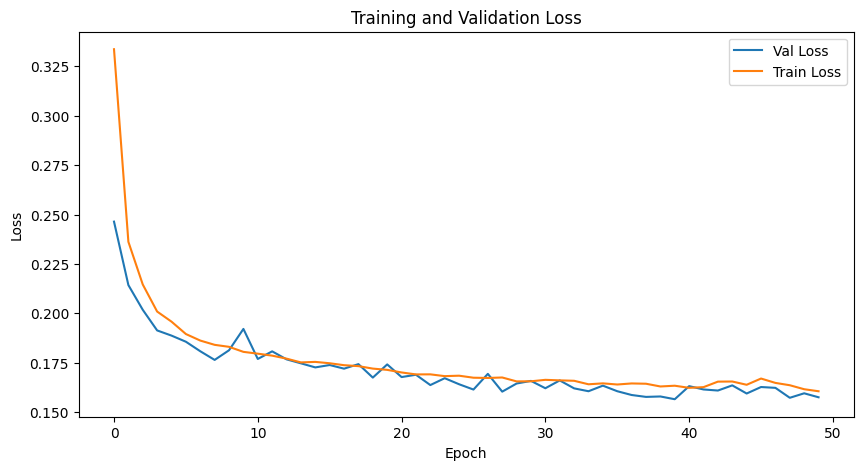

In [ ]:
import time
# Execute the entire pipeline
start_time = time.perf_counter()
pipeline_tcn.run()
end_time = time.perf_counter()

elapsed_seconds = end_time - start_time
print(f"Tempo total da pipeline: {elapsed_seconds:.2f} s ({elapsed_seconds/60:.2f} min)")

hist = pipeline_tcn.step_model_training.history[0]

plt.figure(figsize=(10, 5))
plt.plot(hist["val_loss"], label="Val Loss")
plt.plot(hist["train_loss"], label="Train Loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()


### Resultados
```
Metrics:
  balanced_accuracy: 0.8824
  precision: 0.9539
  recall: 0.9541
  f1: 0.9538
Tempo total da pipeline: 1654.36 s (27.57 min)

```

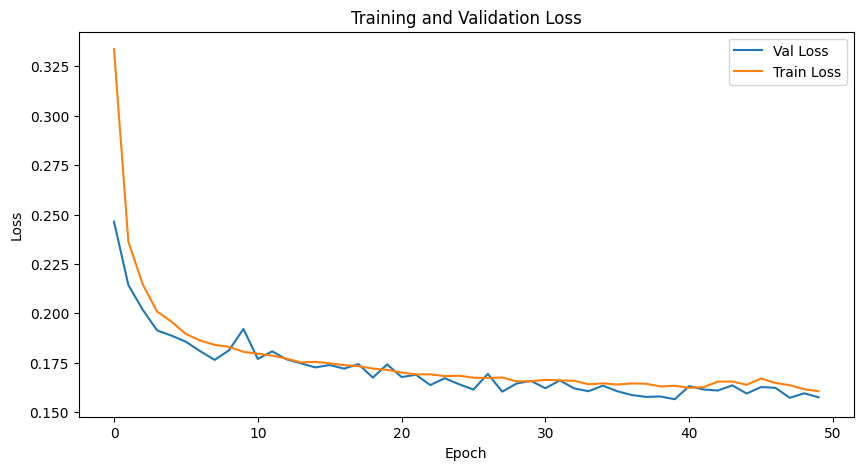



Notas:
- quero adicionar early stop ou algo do tipo

- investigar tecnicas de regularizacao

- investigar otimizadores

Pipeline

# Pipeline 5: TCN

### Dados
* 70% treino 30% teste
* Apenas dados dos sensores "T-JUS-CKP", "T-MON-CKP", "P-PDG"
* Considera as classes 0, 1 e 2
* Janelas de 150 amostras

### Modelo
*  Arquitetura: TCN

* Camadas ocultas: 128, 64 e 32

* Função de ativação: ReLU

* Saída: 3 classes

* Regularização: l1, Valores faltantes (NaN) serão preenchidos usando a média da coluna

* Seed: 42

### Treinamento
* Otimizador: Adam
* Critério: cross entropy
* Épocas: 50
* Batch size: 64
* Learning rate: 0.0005
* Cross-validation: sim
* Shuffle no treino: sim
* Seed: 42

### **TCN** tradicional

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader, TensorDataset
from tqdm.auto import tqdm

import numpy as np
from typing import Iterable, Any, TypeAlias, Union, Callable
from pydantic import Field, field_validator

# Ajuste estes imports para o seu projeto real
# from ..core.base_models import ModelsConfig, BaseModels
# from ..core.enums import ActivationFunctionEnum

ParamsT: TypeAlias = Union[
    Iterable[torch.Tensor],
    Iterable[dict[str, Any]],
    Iterable[tuple[str, torch.Tensor]],
]


class TCNConfig(ModelsConfig):
    """Configuration class for Temporal Convolutional Network (TCN) model.

    Arquitetura baseada em:
    - Convoluções 1D causais
    - Dilatação crescente (ex.: 1, 2, 4, 8, ...)
    - Blocos residuais por camada

    Args:
        model_type (str, optional): Automatically set to "tcn".
        input_channels (int): Number of input channels.
        num_filters (tuple[int, ...]): Número de filtros em cada bloco TCN.
        kernel_size (int): Tamanho do kernel (>= 2).
        output_size (int): Número de saídas (classes ou alvo).
        activation_function (str): "relu", "sigmoid", "tanh".
        dropout (float): Taxa de dropout entre convs do bloco.
        regularization (float | None): L2 regularization (se usado pelo otimizador).
    """

    model_type: str = "tcn"

    input_channels: int = Field(
        default=1,
        gt=0,
        description="Number of input channels (must be > 0).",
    )
    num_filters: tuple[int, ...] = Field(
        ...,
        min_length=1,
        description="Number of filters for each TCN residual block.",
    )
    kernel_size: int = Field(
        default=3,
        ge=2,
        description="Kernel size for all Conv1d layers (>=2).",
    )
    output_size: int = Field(
        ..., gt=0, description="Number of output features/classes (must be > 0)."
    )
    activation_function: str = Field(
        default="relu",
        description="Activation function to use after convolutions.",
    )
    dropout: float = Field(
        default=0.0,
        ge=0.0,
        le=1.0,
        description="Dropout rate applied inside TCN blocks.",
    )
    regularization: float | None = Field(
        default=None,
        ge=0.0,
        description="L2 regularization parameter (>=0 or None).",
    )

    @field_validator("activation_function")
    @classmethod
    def check_activation_function(cls, v: str):
        valid = {
            ActivationFunctionEnum.RELU.value,
            ActivationFunctionEnum.SIGMOID.value,
            ActivationFunctionEnum.TANH.value,
        }
        if v not in valid:
            raise ValueError(f"activation_function must be one of {valid}")
        return v

    @field_validator("num_filters")
    @classmethod
    def check_num_filters(cls, v: tuple[int, ...]):
        if not v or not all(isinstance(h, int) and h > 0 for h in v):
            raise ValueError("num_filters must be a tuple of positive integers")
        return v


class CausalConv1d(nn.Module):
    """Convolução 1D causal com dilatação.

    Implementa padding somente à esquerda para garantir que a saída em t
    não dependa de valores futuros (t+1, t+2, ...).
    """

    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        kernel_size: int,
        dilation: int = 1,
    ) -> None:
        super().__init__()
        self.left_padding = (kernel_size - 1) * dilation
        self.conv = nn.Conv1d(
            in_channels,
            out_channels,
            kernel_size=kernel_size,
            dilation=dilation,
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # F.pad: (pad_left, pad_right) no último eixo
        x = F.pad(x, (self.left_padding, 0))
        return self.conv(x)


class TCNBlock(nn.Module):
    """Bloco residual de TCN com duas convoluções causais dilatadas."""

    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        kernel_size: int,
        dilation: int,
        activation: nn.Module,
        dropout: float,
    ) -> None:
        super().__init__()

        self.conv1 = CausalConv1d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=kernel_size,
            dilation=dilation,
        )
        self.conv2 = CausalConv1d(
            in_channels=out_channels,
            out_channels=out_channels,
            kernel_size=kernel_size,
            dilation=dilation,
        )

        self.activation = activation
        self.dropout = nn.Dropout(dropout)

        # Ajuste para o skip connection se os canais mudarem
        self.downsample = None
        if in_channels != out_channels:
            self.downsample = nn.Conv1d(in_channels, out_channels, kernel_size=1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        residual = x

        out = self.conv1(x)
        out = self.activation(out)
        out = self.dropout(out)

        out = self.conv2(out)
        out = self.activation(out)
        out = self.dropout(out)

        if self.downsample is not None:
            residual = self.downsample(residual)

        return self.activation(out + residual)


class TCN(BaseModels, nn.Module):
    """Temporal Convolutional Network (TCN) implementation.

    Características principais:
    - Convoluções 1D causais
    - Dilatação crescente por bloco (2^i)
    - Blocos residuais empilhados
    - Pooling global ao longo do tempo + FC final
    """

    config: TCNConfig

    def __init__(self, config: TCNConfig) -> None:
        super().__init__(config=config)
        self.config = config

        self.activation = self._get_activation_function(config.activation_function)

        blocks: list[nn.Module] = []
        in_channels = config.input_channels

        # Cria blocos residuais TCN com dilatação crescente: 1, 2, 4, 8, ...
        for i, nf in enumerate(config.num_filters):
            dilation = 2 ** i
            block = TCNBlock(
                in_channels=in_channels,
                out_channels=nf,
                kernel_size=config.kernel_size,
                dilation=dilation,
                activation=self._get_activation_function(config.activation_function),
                dropout=config.dropout,
            )
            blocks.append(block)
            in_channels = nf

        self.conv_net = nn.Sequential(*blocks)

        # Pooling global ao longo do tempo: (B, C, L) -> (B, C, 1)
        self.global_pool = nn.AdaptiveAvgPool1d(1)

        # Camada final totalmente conectada
        self.fc = nn.Linear(in_channels, config.output_size)

    def _get_activation_function(self, activation: str) -> nn.Module:
        if activation == ActivationFunctionEnum.RELU.value:
            return nn.ReLU()
        elif activation == ActivationFunctionEnum.SIGMOID.value:
            return nn.Sigmoid()
        elif activation == ActivationFunctionEnum.TANH.value:
            return nn.Tanh()
        else:
            raise ValueError(f"Unknown activation function: {activation}")

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """Forward pass.

        Espera:
        - x com shape (batch_size, L) ou
        - x com shape (batch_size, C, L)
        """
        if x.dim() == 2:
            x = x.unsqueeze(1)  # (B, L) -> (B, 1, L)
        elif x.dim() == 3:
            pass
        else:
            raise ValueError(f"Expected input with 2 or 3 dims, got {x.shape}")

        x = self.conv_net(x)        # (B, C_out, L)
        x = self.global_pool(x)     # (B, C_out, 1)
        x = x.squeeze(-1)           # (B, C_out)
        logits = self.fc(x)         # (B, output_size)
        return logits

    def get_params(self) -> ParamsT:
        """Return model parameters for optimization."""
        return self.parameters()

    def _train_epoch(
        self,
        model: nn.Module,
        train_loader: DataLoader,
        criterion: Callable,
        optimizer: torch.optim.Optimizer,
        device: str,
    ) -> float:
        model.train()
        epoch_train_loss = 0.0

        for x_values, y_values in train_loader:
            x_values, y_values = x_values.to(device), y_values.to(device)

            optimizer.zero_grad()
            outputs = model(x_values)

            # Mesma lógica de detecção de tarefa usada no MLP
            if outputs.shape[1] > 1:  # Multiclass classification
                y_values = y_values.long()
                loss = criterion(outputs, y_values)
            else:  # Binary classification ou regressão
                if isinstance(criterion, nn.BCEWithLogitsLoss):
                    y_values = y_values.float()
                    loss = criterion(outputs.squeeze(1), y_values)
                else:
                    y_values = y_values.float()
                    loss = criterion(outputs.squeeze(1), y_values)

            loss.backward()
            optimizer.step()
            epoch_train_loss += loss.item()

        return epoch_train_loss / len(train_loader)

    def _calculate_val_loss(
        self,
        val_loader: DataLoader,
        criterion: Callable,
        device: str,
    ) -> float:
        if self.fc is None:
            raise ValueError("Model should be built before validation")

        self.eval()
        running_loss = 0.0

        with torch.no_grad():
            for x_values, y_values in val_loader:
                x_values, y_values = x_values.to(device), y_values.to(device)
                outputs = self.forward(x_values)

                if outputs.shape[1] > 1:
                    y_values = y_values.long()
                    loss = criterion(outputs, y_values)
                else:
                    if isinstance(criterion, nn.BCEWithLogitsLoss):
                        y_values = y_values.float()
                        loss = criterion(outputs.squeeze(1), y_values)
                    else:
                        y_values = y_values.float()
                        loss = criterion(outputs.squeeze(1), y_values)

                running_loss += loss.item()

        return running_loss / len(val_loader)

    def fit(
        self,
        train_loader: DataLoader,
        epochs: int,
        optimizer: torch.optim.Optimizer,
        criterion: Callable,
        val_loader: DataLoader | None = None,
        device: str = "cuda" if torch.cuda.is_available() else "cpu",
    ) -> dict[str, list[Any]]:
        """Train TCN model, seguindo a mesma interface do MLP."""
        self.to(device)

        loss_dict: dict[str, list[Any]] = {"train_loss": []}
        if val_loader is not None:
            loss_dict["val_loss"] = []

        pbar = tqdm(
            range(epochs),
            desc="[Pipeline] Training (TCN)",
            unit="epoch",
            colour="#00b4d8",
        )

        for epoch_idx in pbar:
            avg_epoch_train_loss = self._train_epoch(
                model=self,
                train_loader=train_loader,
                criterion=criterion,
                optimizer=optimizer,
                device=device,
            )
            loss_dict["train_loss"].append(avg_epoch_train_loss)

            if val_loader is not None:
                val_loss = self._calculate_val_loss(val_loader, criterion, device)
                loss_dict["val_loss"].append(val_loss)
                pbar.set_description_str(
                    f"[Pipeline] Training (TCN) | "
                    f"train_loss: {avg_epoch_train_loss:.4f}, val_loss: {val_loss:.4f}"
                )
            else:
                pbar.set_description_str(
                    f"[Pipeline] Training (TCN) | train_loss: {avg_epoch_train_loss:.4f}"
                )

        return loss_dict

    def predict(
        self,
        X: Any,
        device: str = "cuda" if torch.cuda.is_available() else "cpu",
        batch_size: int = 256,
    ) -> np.ndarray:
        """Gera predições a partir de X no mesmo estilo do MLP.predict.

        X pode ser:
        - pandas.DataFrame
        - numpy.ndarray
        - torch.Tensor

        Saída: np.ndarray 1D com rótulos preditos.
        """
        # Converte X para numpy
        if hasattr(X, "values"):  # DataFrame / Series
            X_np = X.values
        elif isinstance(X, torch.Tensor):
            X_np = X.detach().cpu().numpy()
        else:
            X_np = np.asarray(X)

        # Garante float32
        X_np = X_np.astype("float32")

        # Ajusta forma para o TCN:
        # aqui assumo que cada linha é uma janela achatada (N, F)
        # e trato como (N, 1, F): sequência de comprimento F com 1 canal
        if X_np.ndim == 2:
            X_np = X_np[:, None, :]  # (batch, 1, seq_len)
        elif X_np.ndim == 3:
            # se estiver (batch, seq_len, channels), você pode transpor:
            # X_np = np.transpose(X_np, (0, 2, 1))
            pass
        else:
            raise ValueError(f"Expected X with 2 or 3 dims, got shape {X_np.shape}")

        dataset = TensorDataset(torch.tensor(X_np, dtype=torch.float32))
        loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

        self.eval()
        self.to(device)

        y_pred: list[Any] = []
        with torch.no_grad():
            for (X_batch,) in loader:
                X_batch = X_batch.to(device)
                outputs = self.forward(X_batch)

                if outputs.shape[1] > 1:  # Multiclasse
                    _, preds = torch.max(outputs, 1)
                elif outputs.shape[1] == 1:  # Binário
                    preds = (torch.sigmoid(outputs) > 0.5).long().squeeze(1)
                else:  # Regressão
                    preds = outputs.squeeze(1)

                y_pred.extend(preds.cpu().numpy())

        return np.array(y_pred)


### MyTrainerConfig

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd

from pathlib import Path
from typing import Callable, Any
from torch.utils.data import DataLoader
from pydantic import field_validator

from tqdm.auto import tqdm
from sklearn.model_selection import StratifiedKFold, train_test_split

from ThreeWToolkit.core.base_step import BaseStep
from ThreeWToolkit.core.base_model_trainer import ModelTrainerConfig
from ThreeWToolkit.core.enums import OptimizersEnum, CriterionEnum, TaskType
from ThreeWToolkit.models.mlp import MLPConfig, MLP
from ThreeWToolkit.models.sklearn_models import SklearnModelsConfig, SklearnModels
from ThreeWToolkit.utils import ModelRecorder
from torch.utils.data import TensorDataset
from ThreeWToolkit.assessment.model_assess import ModelAssessment, ModelAssessmentConfig


class MyTrainerConfig(ModelTrainerConfig):
    """Configuration class for the ModelTrainer.

    This class defines all the hyperparameters and settings needed to configure
    the training process for machine learning models. It extends the base
    ModelTrainerConfig with specific training-related parameters.

    Args:
        batch_size (int): The number of samples per batch during training.
            Must be greater than 0.
        epochs (int): The total number of training epochs to run.
            Must be greater than 0.
        seed (int): Random seed for reproducibility across training runs.
        learning_rate (float): The learning rate for the optimizer.
            Must be greater than 0.
        config_model (TCNConfig | SklearnModelsConfig): Configuration object
            for the specific model type to be trained.
        criterion (str, optional): Loss function to use during training.
            Options: "cross_entropy", "binary_cross_entropy", "mse", "mae".
            Defaults to "cross_entropy".
        optimizer (str, optional): Optimization algorithm to use.
            Options: "adam", "adamw", "sgd", "rmsprop".
            Defaults to "adam".
        device (str, optional): Computing device for training.
            Options: "cpu", "cuda". Defaults to "cuda" if available, else "cpu".
        cross_validation (bool | None, optional): Whether to use k-fold
            cross-validation during training. Defaults to None (disabled).
        n_splits (int, optional): Number of folds for cross-validation.
            Only used when cross_validation is True. Defaults to 5.
        test_size (float, optional): Proportion of dataset reserved for testing.
            Defaults to 0.2.
        val_size (float, optional): Proportion of training data used for validation.
            Defaults to 0.3.
        shuffle_train (bool, optional): Whether to shuffle training data
            before each epoch. Defaults to True.

    Raises:
        ValueError: If any validation constraint is violated (e.g., negative
            batch_size, invalid optimizer name, etc.).

    Example:
        >>> config = TrainerConfig(
        ...     batch_size=32,
        ...     epochs=100,
        ...     seed=42,
        ...     learning_rate=0.001,
        ...     config_model=TCNConfig(...),
        ...     cross_validation=True,
        ...     n_splits=5
        ... )
    """

    batch_size: int
    epochs: int
    seed: int
    learning_rate: float
    config_model: MLPConfig | SklearnModelsConfig | TCNConfig
    criterion: str = "cross_entropy"
    optimizer: str = "adam"
    device: str = "cuda" if torch.cuda.is_available() else "cpu"
    cross_validation: bool | None = None
    n_splits: int = 5
    test_size: float = 0.2
    val_size: float = 0.3
    shuffle_train: bool = True

    @field_validator("batch_size")
    @classmethod
    def check_batch_size(cls, v):
        """Validate that batch_size is positive.

        Args:
            v (int): The batch size value to validate.

        Returns:
            int: The validated batch size.

        Raises:
            ValueError: If batch_size is not greater than 0.
        """
        if v <= 0:
            raise ValueError("batch_size must be > 0")
        return v

    @field_validator("epochs")
    @classmethod
    def check_epochs(cls, v):
        """Validate that epochs is positive.

        Args:
            v (int): The number of epochs to validate.

        Returns:
            int: The validated number of epochs.

        Raises:
            ValueError: If epochs is not greater than 0.
        """
        if v <= 0:
            raise ValueError("epochs must be > 0")
        return v

    @field_validator("learning_rate")
    @classmethod
    def check_learning_rate(cls, v):
        """Validate that learning_rate is positive.

        Args:
            v (float): The learning rate value to validate.

        Returns:
            float: The validated learning rate.

        Raises:
            ValueError: If learning_rate is not greater than 0.
        """
        if v <= 0:
            raise ValueError("learning_rate must be > 0")
        return v

    @field_validator("n_splits")
    @classmethod
    def check_n_splits(cls, v, values):
        """Validate n_splits when cross-validation is enabled.

        Args:
            v (int): The number of splits to validate.
            values: The validation context containing other field values.

        Returns:
            int: The validated number of splits.

        Raises:
            ValueError: If n_splits is not greater than 1 when cross_validation is True.
        """
        cross_val = (
            values.data.get("cross_validation")
            if hasattr(values, "data")
            else values.get("cross_validation")
        )
        if cross_val and v is not None and v <= 1:
            raise ValueError("n_splits must be > 1 for cross-validation")
        return v

    @field_validator("optimizer")
    @classmethod
    def check_optimizer(cls, v):
        """Validate that optimizer is from the supported list.

        Args:
            v (str): The optimizer name to validate.

        Returns:
            str: The validated optimizer name.

        Raises:
            ValueError: If optimizer is not in the supported list.
        """
        valid = {o.value for o in OptimizersEnum}
        if v not in valid:
            raise ValueError(f"optimizer must be one of {valid}")
        return v

    @field_validator("criterion")
    @classmethod
    def check_criterion(cls, v):
        """Validate that criterion is from the supported list.

        Args:
            v (str): The criterion name to validate.

        Returns:
            str: The validated criterion name.

        Raises:
            ValueError: If criterion is not in the supported list.
        """
        valid = {c.value for c in CriterionEnum}
        if v not in valid:
            raise ValueError(f"criterion must be one of {valid}")
        return v

    @field_validator("device")
    @classmethod
    def check_device(cls, v):
        """Validate that device is either 'cpu' or 'cuda'.

        Args:
            v (str): The device name to validate.

        Returns:
            str: The validated device name.

        Raises:
            ValueError: If device is not 'cpu' or 'cuda'.
        """
        valid = {"cpu", "cuda"}
        if v not in valid:
            raise ValueError("device must be 'cpu' or 'cuda'")
        return v


class MyModelTrainer(BaseStep):
    """Simplified model trainer focused on training with delegated evaluation.

    This class handles the training process for both PyTorch neural networks (MLP)
    and scikit-learn models. It supports regular training, cross-validation, and
    provides convenient methods for model persistence and evaluation.

    The trainer is designed to be lightweight and focused solely on training,
    with evaluation capabilities delegated to the ModelAssessment class for
    better separation of concerns.

    Args:
        config (TrainerConfig): Configuration object containing all training
            parameters and model configuration.

    Attributes:
        config (TrainerConfig): The training configuration.
        lr (float): Learning rate from configuration.
        device (str): Computing device ('cpu' or 'cuda').
        model (MLP | SklearnModels): The instantiated model to train.
        optimizer (torch.optim.Optimizer | None): PyTorch optimizer (None for sklearn models).
        criterion (Callable | None): Loss function (None for sklearn models).
        cross_validation (bool | None): Whether cross-validation is enabled.
        n_splits (int): Number of folds for cross-validation.
        batch_size (int): Batch size for training.
        epochs (int): Number of training epochs.
        seed (int): Random seed for reproducibility.
        shuffle_train (bool): Whether to shuffle training data.
        history (list): Training history from completed training runs.

    Example:
        Basic usage:
        >>> config = TrainerConfig(
        ...     batch_size=32,
        ...     epochs=100,
        ...     seed=42,
        ...     learning_rate=0.001,
        ...     config_model=MLPConfig(...)
        ... )
        >>> trainer = ModelTrainer(config)
        >>> trainer.train(X_train, y_train, X_val, y_val)
        >>>
        >>> # Save the trained model
        >>> trainer.save(Path("model.pth"))
        >>>
        >>> # Evaluate using ModelAssessment
        >>> results = trainer.assess(X_test, y_test)

        Cross-validation usage:
        >>> config = TrainerConfig(
        ...     batch_size=32,
        ...     epochs=100,
        ...     seed=42,
        ...     learning_rate=0.001,
        ...     config_model=MLPConfig(...),
        ...     cross_validation=True,
        ...     n_splits=5
        ... )
        >>> trainer = ModelTrainer(config)
        >>> trainer.train(X_train, y_train)  # No validation set needed
    """

    def __init__(self, config: TrainerConfig) -> None:
        """Initialize the ModelTrainer with the given configuration.

        Args:
            config (TrainerConfig): Configuration object containing all
                training parameters and model settings.
        """
        """Initialize the ModelTrainer with the given configuration.

        Args:
            config (TrainerConfig): Configuration object containing all
                training parameters and model settings.
        """
        self.config = config
        self.lr = config.learning_rate
        self.device = config.device
        self.model = self._get_model(config.config_model)

        self.optimizer: torch.optim.Optimizer | None = self._get_optimizer(
          self.config.optimizer
        )
        self.criterion: Callable[..., Any] | None = self._get_fn_cost(
          self.config.criterion
        )

        self.cross_validation = config.cross_validation
        if self.config.cross_validation:
            self.n_splits = config.n_splits
        self.batch_size = config.batch_size
        self.epochs = config.epochs
        self.seed = config.seed
        self.test_size = config.test_size
        self.val_size = config.val_size
        self.shuffle_train = config.shuffle_train
        self.history: list = []

    def pre_process(self, data: Any) -> dict[str, Any]:
        """Standardizes the input of the step.

        Validates and standardizes the input data format for training.

        Args:
            data: Input data that should contain training data and optionally validation data.
                  Can be a dict or any structure containing the required training data.

        Returns:
            dict[str, Any]: Standardized data dictionary with required keys.

        Raises:
            ValueError: If required training data is missing.
        """
        if isinstance(data, dict):
            processed_data = data.copy()
        else:
            # If data is not a dict, assume it's a tuple/list with (x_train, y_train, ...)
            if hasattr(data, "__iter__") and len(data) >= 2:
                processed_data = {"x_train": data[0], "y_train": data[1]}
                if len(data) >= 4:
                    processed_data.update({"x_val": data[2], "y_val": data[3]})
                if len(data) >= 5:
                    processed_data["kwargs"] = data[4]
            else:
                raise ValueError(
                    "Input data must be a dict or iterable with at least (x_train, y_train)"
                )

        # Validate required keys
        required_keys = ["x_train", "y_train"]
        missing_keys = [key for key in required_keys if key not in processed_data]
        if missing_keys:
            raise ValueError(f"Missing required keys in input data: {missing_keys}")

        # Ensure optional keys exist with None defaults
        optional_keys = ["x_val", "y_val", "kwargs"]
        for key in optional_keys:
            if key not in processed_data:
                processed_data[key] = None if key != "kwargs" else {}

        return processed_data

    def run(self, data: dict[str, Any]) -> dict[str, Any]:
        """Main logic of the step.

        Performs the actual model training using the provided data.

        Args:
            data (dict[str, Any]): Preprocessed data containing training information.

        Returns:
            dict[str, Any]: Data with training results added.
        """
        # Extract training parameters
        x_train = data["x_train"]
        y_train = data["y_train"]
        x_val = data.get("x_val")
        y_val = data.get("y_val")
        kwargs = data.get("kwargs", {})

        # Perform training
        self.train(x_train, y_train, x_val, y_val, **kwargs)

        # Add training results to data
        data["model"] = self.model
        data["history"] = self.history
        data["trainer"] = self

        return data

    def post_process(self, data: dict[str, Any]) -> dict[str, Any]:
        """Standardizes the output of the step.

        Performs any final processing and ensures output format consistency.

        Args:
            data (dict[str, Any]): Data with training results.

        Returns:
            dict[str, Any]: Final processed data ready for next pipeline step.
        """
        # Ensure all expected outputs are present
        expected_outputs = ["model", "history", "trainer"]
        for key in expected_outputs:
            if key not in data:
                raise RuntimeError(
                    f"Training step failed to produce expected output: {key}"
                )

        # Add metadata about the training step
        data["training_completed"] = True
        data["model_type"] = type(self.model).__name__
        data["config"] = self.config

        return data

    def _get_model(
        self, config_model: MLPConfig | SklearnModelsConfig | TCNConfig
    ) -> MLP | SklearnModels | TCNConfig:
        """Instantiate the appropriate model based on the configuration.

        Args:
            config_model (MLPConfig | SklearnModelsConfig): Model configuration
                object that determines which type of model to create.

        Returns:
            MLP | SklearnModels: The instantiated model, moved to the appropriate
                device if it's a PyTorch model.

        Raises:
            ValueError: If the model configuration type is not recognized.
        """
        match config_model:
            case MLPConfig():
                return MLP(config_model).to(self.device)
            case SklearnModelsConfig():
                return SklearnModels(config_model)
            case TCNConfig():
            # Novo: instanciar o TCN quando vier um TCNConfig
                return TCN(config_model)
            case _:
                raise ValueError(f"Unknown model config: {config_model}")

    def _get_optimizer(self, optimizer: str) -> torch.optim.Optimizer:
        """Create and return the specified PyTorch optimizer.

        Args:
            optimizer (str): Name of the optimizer to create. Must be one of:
                "adam", "adamw", "sgd", "rmsprop".

        Returns:
            torch.optim.Optimizer: The configured optimizer instance with
                model parameters and learning rate set.

        Raises:
            ValueError: If the optimizer name is not recognized.
        """
        model_params = self.model.get_params()
        if optimizer == OptimizersEnum.ADAM.value:
            return optim.Adam(params=model_params, lr=self.lr)
        elif optimizer == OptimizersEnum.ADAMW.value:
            return optim.AdamW(params=model_params, lr=self.lr)
        elif optimizer == OptimizersEnum.SGD.value:
            return optim.SGD(params=model_params, lr=self.lr)
        elif optimizer == OptimizersEnum.RMSPROP.value:
            return optim.RMSprop(params=model_params, lr=self.lr)
        else:
            raise ValueError(f"Unknown optimizer: {optimizer}")

    def _get_fn_cost(self, criterion: str | None) -> Callable:
        """Create and return the specified loss function.

        Args:
            criterion (str | None): Name of the loss function to create. Must be
                one of: "cross_entropy", "binary_cross_entropy", "mse", "mae".

        Returns:
            Callable: The configured loss function instance.

        Raises:
            ValueError: If the criterion name is not recognized.
        """
        if criterion == CriterionEnum.CROSS_ENTROPY.value:
            return nn.CrossEntropyLoss()
        elif criterion == CriterionEnum.BINARY_CROSS_ENTROPY.value:
            return nn.BCEWithLogitsLoss()
        elif criterion == CriterionEnum.MSE.value:
            return nn.MSELoss()
        elif criterion == CriterionEnum.MAE.value:
            return nn.L1Loss()
        else:
            raise ValueError(f"Unknown criterion: {criterion}")

    def _create_dataloader(
        self, x: Any, y: Any = None, shuffle: bool = False
    ) -> DataLoader:
        """Create a PyTorch DataLoader from pandas DataFrame/Series.

        Converts pandas data structures to PyTorch tensors and wraps them
        in a DataLoader for batch processing during training.

        Args:
            x (Any): Input features as pandas DataFrame or compatible structure.
            y (Any, optional): Target labels as pandas DataFrame/Series or
                compatible structure. If None, creates empty tensors.
            shuffle (bool, optional): Whether to shuffle data in the DataLoader.
                Defaults to False.

        Returns:
            DataLoader: PyTorch DataLoader configured with the specified
                batch size and shuffle setting.
        """
        X_tensor = torch.tensor(x.values, dtype=torch.float32)
        if y is not None:
            y_tensor = torch.tensor(y.values, dtype=torch.float32)
            dataset = TensorDataset(X_tensor, y_tensor)
        else:
            y_tensor = torch.empty_like(X_tensor)
            dataset = TensorDataset(X_tensor, y_tensor)
        return DataLoader(dataset, batch_size=self.batch_size, shuffle=shuffle)

    def train(
        self,
        x_train: pd.DataFrame,
        y_train: pd.DataFrame | pd.Series,
        x_val: pd.DataFrame | None = None,
        y_val: pd.DataFrame | pd.Series | None = None,
        **kwargs,
    ) -> None:
        """Train the model using the provided training data.

        This method handles three training scenarios:
        1. Cross-validation: Uses k-fold cross-validation with stratified splits
        2. Validation provided: Uses provided validation data
        3. Auto-split: Automatically splits training data for validation

        The training history is stored in self.history for later analysis.

        Args:
            x_train (pd.DataFrame): Training input features.
            y_train (pd.DataFrame | pd.Series): Training target labels.
            x_val (pd.DataFrame | None, optional): Validation input features.
                If None and cross_validation is False, data will be auto-split.
            y_val (pd.DataFrame | pd.Series | None, optional): Validation target
                labels. If None and cross_validation is False, data will be auto-split.
            **kwargs: Additional keyword arguments passed to the underlying
                model's fit method.

        Note:
            - For cross-validation, x_val and y_val are ignored
            - Model state is reset between cross-validation folds for PyTorch models
            - Training history is stored as a list of fold histories (cross-validation)
            or a single-element list (regular training)
        """
        if self.cross_validation:
            self.history = []

            # Create stratified k-fold splits
            skf = StratifiedKFold(
                n_splits=self.n_splits, shuffle=True, random_state=self.seed
            )
            splits = list(skf.split(x_train, y_train))

            # Store initial model configuration for resetting between folds
            initial_config = self.config.config_model

            # Perform stratified k-fold cross-validation with progress bar
            pbar = tqdm(
                enumerate(splits),
                total=self.n_splits,
                desc="[Pipeline] Training Fold 1",
                unit="fold",
                colour="#0a2c53",
            )
            for fold, (train_idx, val_idx) in pbar:
                # Updates the bar description for the current fold
                pbar.set_description_str(f"[Pipeline] Training Fold {fold + 1}")

                # Reinitialize model for each fold (fresh start)
                if isinstance(self.model, MLP):
                    self.model = self._get_model(initial_config)
                    # Reinitialize optimizer with new model parameters
                    self.optimizer = self._get_optimizer(self.config.optimizer)

                # Split data for current fold
                x_train_fold = self._select_rows(x_train, train_idx)
                y_train_fold = self._select_rows(y_train, train_idx)
                x_val_fold = self._select_rows(x_train, val_idx)
                y_val_fold = self._select_rows(y_train, val_idx)

                # Train on current fold and store history
                fold_history = self.call_trainer(
                    x_train_fold,
                    y_train_fold,
                    x_val=x_val_fold,
                    y_val=y_val_fold,
                    **kwargs,
                )
                self.history.append(fold_history)

        elif x_val is not None and y_val is not None:
            # Use provided validation data
            self.history = [
                self.call_trainer(x_train, y_train, x_val=x_val, y_val=y_val, **kwargs)
            ]
        else:
            # Automatically split training data for validation
            x_train, y_train, x_val, y_val = self.holdout(x_train, y_train)
            self.history = [
                self.call_trainer(x_train, y_train, x_val=x_val, y_val=y_val, **kwargs)
            ]

    def holdout(self, X, Y, test_size=None):
        """
        Split any dataset into two subsets using holdout.

        Args:
            X (array-like): Features.
            Y (array-like): Targets.
            test_size (float, optional): Fraction of data for the second split.
                If None, uses self.val_size. Should be between 0 and 1.

        Returns:
            Tuple: (X_train, Y_train, X_holdout, Y_holdout)
        """
        if test_size is None:
            test_size = self.val_size

        X_train, X_holdout, Y_train, Y_holdout = train_test_split(
            X,
            Y,
            test_size=test_size,
            shuffle=self.shuffle_train,
            random_state=self.seed,
        )
        return X_train, Y_train, X_holdout, Y_holdout

    def _select_rows(self, data, idx):
        """Select rows from data using provided indices.

        Handles both pandas DataFrames/Series and other indexable data structures.

        Args:
            data: The data structure to index (DataFrame, Series, or array-like).
            idx: The indices to select.

        Returns:
            The selected subset of data.
        """
        if hasattr(data, "iloc"):
            return data.iloc[idx]
        else:
            return data[idx]

    def call_trainer(
        self,
        x_train: Any,
        y_train: Any,
        x_val: Any = None,
        y_val: Any = None,
        **kwargs,
    ) -> dict[str, list[Any]] | None:
        """Call the appropriate training method based on model type.

        Dispatches training to either PyTorch neural network training loop
        or scikit-learn model fitting, handling the different interfaces
        transparently.

        Args:
            x_train (Any): Training input features.
            y_train (Any): Training target labels.
            x_val (Any, optional): Validation input features.
            y_val (Any, optional): Validation target labels.
            **kwargs: Additional arguments passed to the model's fit method.

        Returns:
            dict[str, list[Any]] | None: Training history dictionary for PyTorch
                models (containing loss/metric trajectories), or None for
                scikit-learn models.
        """
        if isinstance(self.model, MLP) | isinstance(self.model, TCN):
            # PyTorch model training
            train_loader = self._create_dataloader(
                x_train, y_train, shuffle=self.shuffle_train
            )
            val_loader = (
                self._create_dataloader(x_val, y_val, shuffle=False)
                if x_val is not None and y_val is not None
                else None
            )

            # Use configured optimizer/criterion or fallback to defaults
            optimizer = (
                self.optimizer
                if self.optimizer is not None
                else torch.optim.Adam(self.model.parameters(), lr=self.lr)
            )
            criterion = self.criterion if self.criterion is not None else nn.MSELoss()

            return self.model.fit(
                train_loader,
                self.epochs,
                optimizer,
                criterion,
                val_loader,
                device=self.device,
            )
        else:
            # Scikit-learn model training
            return self.model.fit(x_train, y_train, **kwargs)

    def save(self, filepath: Path) -> None:
        """Save the trained model to disk.

        Uses the ModelRecorder utility to save model checkpoints in a
        consistent format across different model types.

        Args:
            filepath (Path): The file path where the model should be saved.
                The extension should be appropriate for the model type
                (.pth for PyTorch models, .pkl for scikit-learn models).

        Note:
            The saved model can be loaded later using the load() method.
        """
        ModelRecorder.save_best_model(model=self.model, filename=filepath)

    def load(self, filepath: Path) -> MLP | SklearnModels:
        """Load a previously saved model from disk.

        Loads model weights/parameters from the specified file and applies
        them to the current model instance.

        Args:
            filepath (Path): The file path from which to load the model.
                Should contain a model saved with the save() method.

        Returns:
            MLP | SklearnModels: The model instance with loaded weights/parameters.

        Note:
            For PyTorch models, this loads the state dict. For scikit-learn
            models, this loads the entire model state.
        """
        state_dict = ModelRecorder.load_model(filename=filepath)
        if isinstance(self.model, MLP):
            self.model.load_state_dict(state_dict)
        return self.model

    def assess(
        self,
        x_test: Any,
        y_test: Any,
        assessment_config: ModelAssessmentConfig | None = None,
        **kwargs,
    ) -> dict[str, Any]:
        """Evaluate the trained model using ModelAssessment.

        This is a convenience method that creates a ModelAssessment instance
        and evaluates the current model on the provided test data.

        Args:
            x_test (Any): Test input features for evaluation.
            y_test (Any): Test target labels for evaluation.
            assessment_config (ModelAssessmentConfig | None, optional):
                Configuration for the assessment process. If None, creates
                a default configuration based on the task type.
            **kwargs: Additional arguments passed to ModelAssessment.evaluate().

        Returns:
            dict[str, Any]: Dictionary containing evaluation results with
                metrics, predictions, and other assessment information.

        Example:
            >>> # Basic assessment with default configuration
            >>> results = trainer.assess(X_test, y_test)
            >>> print(f"Accuracy: {results['accuracy']}")
            >>>
            >>> # Custom assessment configuration
            >>> config = ModelAssessmentConfig(
            ...     metrics=["accuracy", "f1", "precision", "recall"],
            ...     task_type=TaskType.CLASSIFICATION
            ... )
            >>> results = trainer.assess(X_test, y_test, assessment_config=config)
        """
        if assessment_config is None:
            # Create default assessment configuration based on task type
            assessment_config = ModelAssessmentConfig(
                metrics=(
                    ["accuracy"]
                    if self._is_classification_task()
                    else ["explained_variance"]
                ),
                task_type=(
                    TaskType.CLASSIFICATION
                    if self._is_classification_task()
                    else TaskType.REGRESSION
                ),
            )

        assessor = ModelAssessment(assessment_config)
        assessor._setup_metrics()
        return assessor.evaluate(self.model, x_test, y_test, **kwargs)

    def _is_classification_task(self) -> bool:
        """Determine if the current task is classification based on the loss function.

        Uses a heuristic approach by checking if the configured criterion
        is typically used for classification tasks.

        Returns:
            bool: True if this appears to be a classification task,
                False if it appears to be a regression task.

        Note:
            This is a heuristic and may not always be accurate. For more
            precise control, specify the task_type explicitly in the
            assessment_config parameter of the assess() method.
        """
        classification_criteria = {
            CriterionEnum.CROSS_ENTROPY.value,
            CriterionEnum.BINARY_CROSS_ENTROPY.value,
        }
        return self.config.criterion in classification_criteria

### My Pipeline

In [ ]:
import torch
import logging
import pandas as pd
from typing import Any, Optional
from pydantic import BaseModel

from ThreeWToolkit.models.mlp import MLP
from tqdm.auto import tqdm

from ThreeWToolkit.assessment.model_assess import ModelAssessment
from ThreeWToolkit.core.base_assessment import ModelAssessmentConfig
from ThreeWToolkit.core.base_dataset import ParquetDatasetConfig
from ThreeWToolkit.core.base_preprocessing import (
    ImputeMissingConfig,
    NormalizeConfig,
    RenameColumnsConfig,
    WindowingConfig,
)
from ThreeWToolkit.core.base_step import BaseStep
from ThreeWToolkit.dataset.parquet_dataset import ParquetDataset
from ThreeWToolkit.feature_extraction.extract_exponential_statistics_features import (
    EWStatisticalConfig,
    ExtractEWStatisticalFeatures,
)
from ThreeWToolkit.feature_extraction.extract_statistical_features import (
    ExtractStatisticalFeatures,
    StatisticalConfig,
)
from ThreeWToolkit.feature_extraction.extract_wavelet_features import (
    ExtractWaveletFeatures,
    WaveletConfig,
)
from ThreeWToolkit.models.sklearn_models import SklearnModels
from ThreeWToolkit.preprocessing._data_processing import (
    ImputeMissing,
    Normalize,
    RenameColumns,
    Windowing,
)

logging.basicConfig(level=logging.INFO, format="[%(levelname)s] %(message)s")


class MyPipeline:
    """
    A flexible machine learning pipeline for processing time series data.

    This pipeline orchestrates the complete ML workflow from data loading through
    preprocessing, feature extraction, model training, and assessment. It supports
    various configurations for each step and ensures proper validation and ordering
    of processing steps.

    Attributes:
        step_data_loader (Optional[ParquetDataset]): Data loading component
        step_preprocessing (list[Any]): List of preprocessing steps
        step_feat_extraction (list[Any]): List of feature extraction steps
        step_model_training (Optional[ModelTrainer]): Model training component
        step_model_assessment (Optional[ModelAssessment]): Model assessment component
    """

    def __init__(self, configs: list[BaseModel]):
        """
        Initialize the pipeline with a list of configuration objects.

        Args:
            configs (list[BaseModel]): List of configuration objects for different
                                     pipeline steps (dataset, preprocessing, feature
                                     extraction, training, assessment)
        """
        # Initialize class attributes
        self.step_data_loader: Optional[ParquetDataset] = None
        self.step_preprocessing: list[Any] = []
        self.step_feat_extraction: list[Any] = []
        self.step_model_training: Optional[MyModelTrainer] = None
        self.step_model_assessment: Optional[ModelAssessment] = None

        self._factory_model(configs)
        self._validate_steps()

    def _factory_model(self, configs: list[BaseModel]):
        """
        Factory method to instantiate pipeline components based on configurations.

        Processes each configuration object and creates the corresponding pipeline
        component (dataset loader, preprocessing steps, feature extractors, etc.).

        Args:
            configs (list[BaseModel]): List of configuration objects

        Raises:
            ValueError: If an unsupported configuration type is provided
        """
        for config in configs:
            # Dataset
            if isinstance(config, ParquetDatasetConfig):
                self.step_data_loader = ParquetDataset(config)
            # Preprocessing
            elif isinstance(config, ImputeMissingConfig):
                self.step_preprocessing.append(ImputeMissing(config))
            elif isinstance(config, NormalizeConfig):
                self.step_preprocessing.append(Normalize(config))
            elif isinstance(config, RenameColumnsConfig):
                self.step_preprocessing.append(RenameColumns(config))
            elif isinstance(config, WindowingConfig):
                self.step_preprocessing.append(Windowing(config))
            # Feature Extraction
            elif isinstance(config, StatisticalConfig):
                self.step_feat_extraction.append(ExtractStatisticalFeatures(config))
            elif isinstance(config, WaveletConfig):
                self.step_feat_extraction.append(ExtractWaveletFeatures(config))
            elif isinstance(config, EWStatisticalConfig):
                self.step_feat_extraction.append(ExtractEWStatisticalFeatures(config))
            # Model Training
            elif isinstance(config, TrainerConfig):
                self.step_model_training = MyModelTrainer(config)
            elif isinstance(config, MyTrainerConfig):
                self.step_model_training = MyModelTrainer(config)
            # Model Assessment
            elif isinstance(config, ModelAssessmentConfig):
                self.step_model_assessment = ModelAssessment(config)
            else:
                raise ValueError(f"Configuration {config} is not supported")

    def _validate_steps(self):
        """
        Validate that all mandatory pipeline steps are properly defined.

        Checks for required components and ensures they inherit from BaseStep.
        Also validates and fixes the order of preprocessing steps.

        Raises:
            ValueError: If mandatory steps are missing or improperly configured
            TypeError: If steps don't inherit from BaseStep
        """
        # Check if mandatory steps are defined
        if self.step_data_loader is None:
            raise ValueError("The 'data_loader' step must be defined.")

        if not isinstance(self.step_data_loader, BaseStep):
            raise TypeError("The 'data_loader' step must inherit from BaseStep.")

        self.step_preprocessing = self._validate_and_fix_preprocessing_steps(
            self.step_preprocessing
        )

        if len(self.step_feat_extraction) > 1:
            raise ValueError(
                f"Only one feature extraction strategy is allowed, "
                f"but {len(self.step_feat_extraction)} were provided."
            )

        for feat_extraction in self.step_feat_extraction:
            if not isinstance(feat_extraction, BaseStep):
                raise TypeError(
                    f"The step '{feat_extraction.__class__.__name__}' must inherit from BaseStep."
                )

        if not isinstance(self.step_model_training, BaseStep):
            raise ValueError("The 'model_training' step must inherit from BaseStep.")
        else:
            if not isinstance(self.step_model_training, (MyModelTrainer, SklearnModels)):
                raise ValueError(
                    "The 'model_training' step must be a ModelTrainer or SklearnModels instance."
                )

        if not isinstance(self.step_model_assessment, BaseStep):
            raise ValueError("The 'model_assessment' step must inherit from BaseStep.")

    def _validate_and_fix_preprocessing_steps(self, steps):
        """
        Validate and automatically adjust the order of preprocessing steps.

        Enforces the following rules:
        - Only one RenameColumns step is allowed
        - If Windowing exists, it must always be the last step
        - If Windowing does not exist, RenameColumns must be the last step

        Args:
            steps (list): List of preprocessing steps

        Returns:
            list: Reordered list of preprocessing steps

        Raises:
            TypeError: If steps don't inherit from BaseStep
            ValueError: If multiple RenameColumns steps are provided
        """
        for step in steps:
            if not isinstance(step, BaseStep):
                raise TypeError(
                    f"Step '{step.__class__.__name__}' must inherit from BaseStep."
                )

        rename_steps = [s for s in steps if isinstance(s, RenameColumns)]
        windowing_steps = [s for s in steps if isinstance(s, Windowing)]

        # More than one RenameColumns is not allowed
        if len(rename_steps) > 1:
            raise ValueError("Only one RenameColumns step is allowed.")

        # Adjust order when Windowing exists
        if windowing_steps:
            # If Windowing is not the last step, move it
            if not isinstance(steps[-1], Windowing):
                logging.info("[Pipeline] Moving Windowing step to the last position.")
                steps = [
                    s for s in steps if not isinstance(s, Windowing)
                ] + windowing_steps

            # If RenameColumns exists after Windowing, move it before
            if rename_steps and steps.index(rename_steps[0]) > steps.index(
                windowing_steps[0]
            ):
                logging.info("[Pipeline] Moving RenameColumns step before Windowing.")
                steps.remove(rename_steps[0])
                idx_win = steps.index(windowing_steps[0])
                steps.insert(idx_win, rename_steps[0])

        else:
            # No Windowing → RenameColumns must be the last step
            if rename_steps and not isinstance(steps[-1], RenameColumns):
                logging.info(
                    "[Pipeline] Moving RenameColumns step to the last position."
                )
                steps.remove(rename_steps[0])
                steps.append(rename_steps[0])

        return steps

    def _batch_iterator(self, data_loader, feature_names=None):
        """
        Iterator for processing batches from DataLoader or list of batches.

        Converts batch data to DataFrame format with X features and y target,
        where y is the last column.

        Args:
            data_loader: DataLoader or iterable containing batch data
            feature_names (list, optional): Names for feature columns

        Yields:
            pd.DataFrame: DataFrame with features and target (if available)

        Raises:
            ValueError: If batch format is not supported
        """
        if data_loader is not None:
            for batch in data_loader:
                if isinstance(batch, torch.Tensor):
                    x, y = batch, None
                elif isinstance(batch, (list, tuple)) and len(batch) == 2:
                    x, y = batch
                else:
                    raise ValueError(f"Unsupported batch format: {type(batch)}")

                # Convert X to DataFrame
                x_df = pd.DataFrame(
                    x.numpy() if isinstance(x, torch.Tensor) else x,
                    columns=feature_names,
                )

                # Convert y to Series
                y_series = (
                    pd.Series(
                        y.numpy().ravel() if isinstance(y, torch.Tensor) else y,
                        name="target",  # fixed or configurable name
                    )
                    if y is not None
                    else None
                )

                # Concatenate X and y (if it exists)
                if y_series is not None:
                    df = pd.concat([x_df, y_series], axis=1)
                else:
                    df = x_df

                yield df

    def run(self):
        """
        Execute the complete machine learning pipeline.

        Processes all data batches through preprocessing and feature extraction,
        trains the model, and performs assessment. Displays progress using rich
        progress bars.

        Raises:
            NotImplementedError: If model type is not supported or training is undefined
        """
        # Train the model if training step exists
        if self.step_model_training:
            if not isinstance(self.step_model_training.model, (MLP, SklearnModels, TCN)):
                raise NotImplementedError("Model not implemented yet.")

            if self.step_data_loader is None:
                raise ValueError("Data loader step is not defined.")

            total_files = len(self.step_data_loader)

            dfs = []

            with tqdm(
                total=total_files,
                desc="[Pipeline] Processing batches",
                unit="file",
                colour="#386641",
            ) as pbar:
                for batch in self.step_data_loader.iterbatches():
                    nfiles = self._get_nfiles_per_batch(batch)
                    df_processed = self.run_prep_steps(batch)
                    dfs.append(df_processed)

                    pbar.update(nfiles)

            dfs_final = pd.concat(dfs, ignore_index=True, axis=0)

            x_train, y_train, x_test, y_test = self.step_model_training.holdout(
                X=dfs_final.iloc[:, :-1],
                Y=dfs_final["label"].astype(int),
                test_size=self.step_model_training.test_size,
            )
            results = self.step_model_training((x_train, y_train))

            if self.step_model_assessment is None:
                raise ValueError("Model assessment step is not defined.")

            self.step_model_assessment((results["model"], x_test, y_test))
        else:
            raise NotImplementedError("TODO: Implement pipeline without training")

    def run_prep_steps(self, batch: dict) -> pd.DataFrame | None:
        """
        Execute preprocessing and feature extraction steps on a batch.

        Sequentially applies all preprocessing steps followed by feature extraction
        to prepare the data for model training.

        Args:
            batch: Input batch data

        Returns:
            pd.DataFrame: Processed batch ready for training
        """
        # Execute all preprocessing steps
        batch_prep = batch

        if self.step_preprocessing:
            batch_prep = self.run_step_preprocessing(batch_prep)

        # Execute feature extraction
        if self.step_feat_extraction:
            batch_prep = self.run_step_feature_extraction(batch_prep)
        else:
            if isinstance(batch_prep, dict):
                _, batch_prep = self._check_and_apply_windowing(batch_prep)

        return batch_prep

    def run_step_preprocessing(self, batch: dict) -> dict[Any, Any]:
        """
        Execute preprocessing steps on the batch data.

        Applies each preprocessing step sequentially to all files in the batch.
        Each step receives a DataFrame with all signals for a file and returns
        a processed DataFrame that may have different columns (renamed, created, or removed).

        Args:
            batch (dict): Batch containing 'signals' and 'labels' data

        Returns:
            dict: Processed batch with updated signals and labels structure
        """
        if self.step_data_loader is None:
            raise ValueError("Data loader step is not defined.")

        # Create a copy of the batch to avoid modifying the original
        batch_processed = {}
        batch_processed.update({key: value for key, value in list(batch.items())})

        # Progress bar for preprocessing steps
        for step in tqdm(
            self.step_preprocessing,
            desc="[Pipeline] Preprocessing steps",
            leave=False,
            unit="step",
            colour="#a7c957",
        ):
            keys = list(batch["signals"].keys())
            target_column = self.step_data_loader.config.target_column

            # Initialize new batch structure for processed data
            new_signals = {}
            new_labels = []

            nfiles = self._get_nfiles_per_batch(batch)

            # Process each file in the batch individually
            for idx_data_file in range(nfiles):
                file_labels = batch["labels"][target_column][idx_data_file]

                # Prepare DataFrames for each signal in the current file
                dfs_for_file = []
                for signal_name in keys:
                    signal_data = batch["signals"][signal_name][idx_data_file]
                    # Convert signal data to DataFrame with proper column name
                    df_signal = pd.DataFrame(signal_data, columns=[signal_name])
                    dfs_for_file.append(df_signal)

                # Concatenate all signals for this file into a single DataFrame
                df_file = pd.concat(dfs_for_file, axis=1)

                # Clean up: remove label column if it exists (shouldn't at this stage)
                if "label" in df_file.columns:
                    df_file = df_file.drop("label", axis=1)

                # Apply the preprocessing step to the file's data
                processed_df: pd.DataFrame = step(df_file)

                # Store processed data as dictionary for this file
                new_signals[idx_data_file] = processed_df.to_dict()

                if not step.__class__.__name__ == "Windowing":
                    new_labels.append(file_labels)
                else:
                    labels_series = pd.Series(file_labels)
                    label_step_config = step.config.copy()
                    label_step_config.window = "boxcar"
                    label_step_config.normalize = False
                    label_step = Windowing(label_step_config)

                    windowed_label = label_step(labels_series)
                    windowed_label.drop(columns=["win"], inplace=True)

                    new_labels.append(windowed_label.mode(axis=1)[0].values)

            # Update batch with processed signals and labels
            batch_processed["signals"] = new_signals
            batch_processed["labels"] = new_labels

        return batch_processed

    def _get_nfiles_per_batch(self, batch):
        """
        Get the number of files in a batch.

        Args:
            batch (dict): Batch containing signals data

        Returns:
            int: Number of files in the batch
        """
        signals = batch["signals"]
        nfiles = len(signals[next(iter(signals))])
        return nfiles

    def run_step_feature_extraction(self, batch: dict) -> pd.DataFrame:
        """
        Execute feature extraction steps on the preprocessed batch data.

        Converts windowed signal data into features by applying feature extraction
        algorithms. Ensures windowing is applied if not already done during preprocessing.

        Args:
            batch (dict): Preprocessed batch containing windowed signals and labels

        Returns:
            pd.DataFrame: Feature matrix with extracted features and labels
        """
        if self.step_data_loader is None:
            raise ValueError("Data loader step is not defined.")

        df = pd.DataFrame()
        # Progress bar for feature extraction steps
        for step in tqdm(
            self.step_feat_extraction,
            desc="[Pipeline] Feature Extraction",
            leave=False,
            unit="step",
            colour="#a7c957",
        ):
            # Check if windowing was applied during preprocessing
            is_windowing_applied, df_batch = self._check_and_apply_windowing(batch)

            # Configure the feature extraction step
            if isinstance(
                step, (ExtractEWStatisticalFeatures, ExtractStatisticalFeatures)
            ):
                if not is_windowing_applied:
                    window_size = WindowingConfig.window_size
                else:
                    cls: Windowing = next(
                        c
                        for c in self.step_preprocessing
                        if c.__class__.__name__ == "Windowing"
                    )
                    window_size = cls.config.window_size
                step.window_size = window_size
            step.is_windowed = True
            step.label_column = "label"

            # Apply feature extraction to the entire batch
            df = step(df_batch)

        return df

    def _check_and_apply_windowing(
        self, batch: dict[Any, Any]
    ) -> tuple[bool, pd.DataFrame]:
        """
        Ensure that windowing has been applied to the batch.

        If no instance of `Windowing` exists in the preprocessing steps,
        a default windowing configuration (`pad_last_window=True`) is applied.
        Each signal in the batch is then converted into a DataFrame,
        windowing is applied if required, and the data is prepared for
        feature extraction.

        Args:
            batch (dict): Dictionary containing:
                - "signals": list of arrays or DataFrames with raw signals
                - "labels": list of arrays with the corresponding labels

        Returns:
            tuple:
                - bool: whether windowing was already applied
                - pd.DataFrame: concatenated DataFrame containing all signals
                (with windowing applied if necessary) and the "label" column
        """
        is_windowing_applied = any(
            isinstance(s, Windowing) for s in self.step_preprocessing
        )
        if not is_windowing_applied:
            logging.warning(
                "Feature extraction classes require data windowing. None was provided; "
                "default windowing will be applied."
            )
            # Apply default windowing configuration
            windowing = Windowing(WindowingConfig(pad_last_window=True))
            label_windowing = Windowing(
                WindowingConfig(window="boxcar", pad_last_window=True)
            )

            all_dfs = []
            # Process each file in the batch
            for idx_data_file in range(len(batch["signals"])):
                # Get signal data for this file
                signal_data = batch["signals"][idx_data_file]

                file_labels = batch["labels"][idx_data_file]

                # Convert signal data to DataFrame
                df_signal = pd.DataFrame(signal_data)
                # Convert label data to Series
                labels_series = pd.Series(file_labels)

                df_signal = windowing(df_signal)
                df_label = label_windowing(labels_series)

                # Clean up: remove windowing index column if present
                df_signal = df_signal.drop("win", axis=1, errors="ignore")
                df_label = df_label.drop("win", axis=1, errors="ignore")

                df_signal["label"] = df_label.mode(axis=1)[0].values
                all_dfs.append(df_signal)

            # Concatenate all files into a single DataFrame for feature extraction
            df_batch = pd.concat(all_dfs, axis=0, ignore_index=True)

            return is_windowing_applied, df_batch

        else:
            all_dfs = []

            for idx_data_file in range(len(batch["signals"])):
                signal_data = batch["signals"][idx_data_file]

                df_signal = pd.DataFrame(signal_data)

                df_signal = df_signal.drop("win", axis=1, errors="ignore")

                df_signal["label"] = batch["labels"][idx_data_file]

                all_dfs.append(df_signal)

            # Concatenate all files into a single DataFrame for feature extraction
            df_batch = pd.concat(all_dfs, axis=0, ignore_index=True)

            return is_windowing_applied, df_batch

## Pipeline

In [ ]:
# Configuração do modelo TCN multivariado
config_model_tcn = TCNConfig(
    input_channels=1,               # 3 canais: T-JUS-CKP, T-MON-CKP, P-PDG
    num_filters=(32, 64, 128),      # filtros por bloco TCN
    kernel_size=3,
    output_size=3,                  # três classes (0, 1, 2)
    activation_function="relu",
    dropout=0.1,
    regularization=None,
)

pipeline_tcn = MyPipeline(
    [
        # 1) Leitura do dataset
        ParquetDatasetConfig(
            path=dataset_path,
            split=None,  # idealmente usar algo como "train"/"val" com split temporal
            force_download=False,
            columns=["T-JUS-CKP", "T-MON-CKP", "P-PDG"],
            target_column="class",
            target_class=[0, 1, 2],
        ),

        # 2) Imputação de faltantes (por coluna)
        ImputeMissingConfig(
            strategy="mean",              # média por coluna
            columns=None,                 # None = todas as colunas numéricas
        ),

        NormalizeConfig(norm="l1"),

        # 4) Janela temporal
        # Ideal: essa etapa deve produzir tensores com shape (B, 3, 150)
        #    -> 3 canais (features), janela temporal de 150 passos
        WindowingConfig(
            window_size=150,
            # se existir algum parâmetro do tipo "channels_first=True", use aqui.
            # Caso contrário, garanta no Dataset ou no collate_fn que o tensor final
            # entregue ao modelo esteja em (batch, channels, seq_len).
        ),

        # 5) Treinador
        MyTrainerConfig(
            optimizer="adam",
            criterion="cross_entropy",
            batch_size=64,
            epochs=50,
            seed=42,
            config_model=config_model_tcn,
            learning_rate=0.0005,

            # Para série temporal: evitar CV aleatória + shuffle
            cross_validation=False,       # desliga K-fold aleatório
            shuffle_train=False,          # não embaralhar sequências no tempo

            # A lógica de split temporal (treino/val/test) idealmente fica
            # na definição dos datasets (por exemplo, múltiplos ParquetDatasetConfig
            # ou controle por "split").
        ),

        # 6) Avaliação do modelo
        ModelAssessmentConfig(
            metrics=["balanced_accuracy", "precision", "recall", "f1"],
            task_type=TaskType.CLASSIFICATION,
            export_results=True,
            generate_report=False,
        ),
    ]
)


[ParquetDataset] Dataset found at ./dataset
[ParquetDataset] Validating dataset integrity...
[ParquetDataset] Dataset integrity check passed!
>> ['T-JUS-CKP', 'T-MON-CKP', 'P-PDG']


[Pipeline] Processing batches:   0%|          | 0/760 [00:00<?, ?file/s]

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Preprocessing steps:   0%|          | 0/3 [00:00<?, ?step/s]

/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.12/migration/
  label_step_config = step.config.copy()
/tmp/ipython-input-258939786.py:427: PydanticDeprecatedSince20: The `copy` method is deprecated; use `model_copy` instead. See the docstring of `BaseModel.copy` for details about how to handle `include` and `exclude`. Depr

[Pipeline] Training (TCN):   0%|          | 0/50 [00:00<?, ?epoch/s]

Results exported to /usr/local/lib/python3.12/dist-packages/output
Model Assessment Summary
Model: TCN
Task Type: TaskType.CLASSIFICATION
Timestamp: 2025-12-10T17:02:13.786221

Metrics:
  balanced_accuracy: 0.9147
  precision: 0.9484
  recall: 0.9472
  f1: 0.9474
Tempo total da pipeline: 605.44 s (10.09 min)


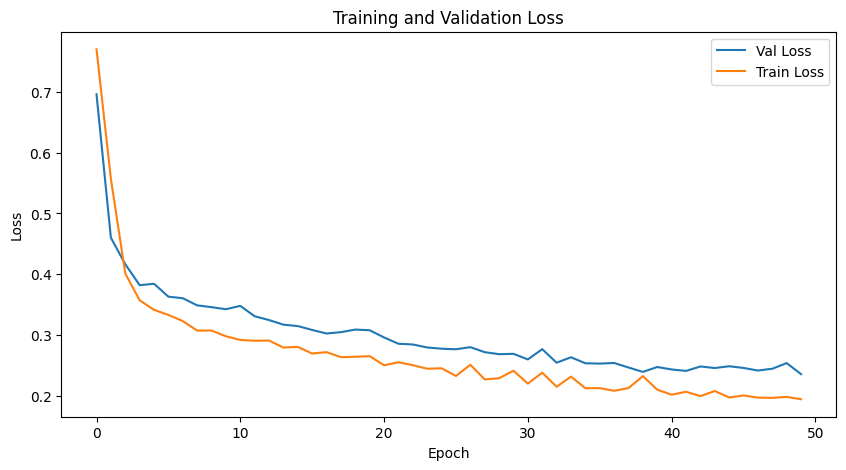

In [ ]:
import time
# Execute the entire pipeline
start_time = time.perf_counter()
pipeline_tcn.run()
end_time = time.perf_counter()

elapsed_seconds = end_time - start_time
print(f"Tempo total da pipeline: {elapsed_seconds:.2f} s ({elapsed_seconds/60:.2f} min)")

hist = pipeline_tcn.step_model_training.history[0]

plt.figure(figsize=(10, 5))
plt.plot(hist["val_loss"], label="Val Loss")
plt.plot(hist["train_loss"], label="Train Loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()


### Resultados
```
Metrics:
  balanced_accuracy: 0.9147
  precision: 0.9484
  recall: 0.9472
  f1: 0.9474
Tempo total da pipeline: 605.44 s (10.09 min)
```

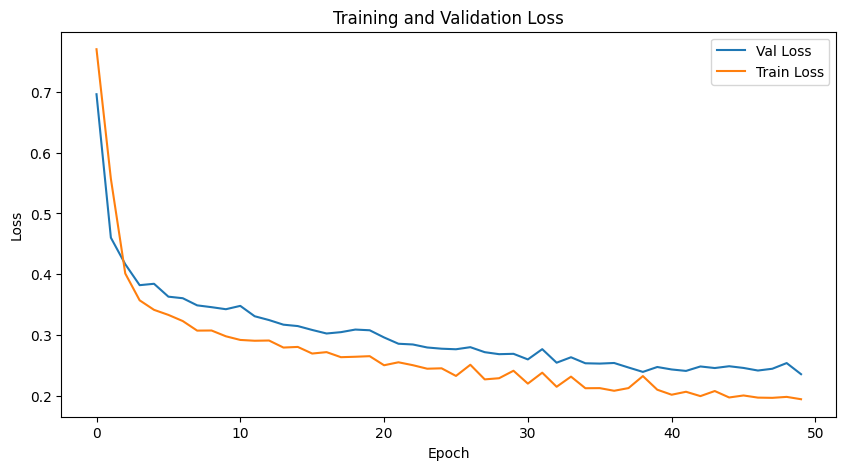

